
## Automatic Classification of Pneunomia based on X-rays

---

## Dataset Overview

* The Pneunomia dataset contains x-rays from patients being ``normal`` or having ``pneunomia``.

## Importing Libraries

In [ ]:
!pip install scikit-plot

In [ ]:
!pip install grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 18.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.4.8-py3-none-any.whl size=38244 sha256=871963838cd47441874a9a3f394db53add5dbb26fca88cf2faf1fc47165e5954
  Stored in directory: /root/.cache/pip/wheels/f8/04/36/94ff3c8a4215826a21946b34c01180817e606989fdf53f7cd6
Successfully built grad-cam


In [ ]:
import time
import os
import copy

import numpy as np
from PIL import Image
import PIL as PIL
import pandas as pd
import seaborn as sns
import scikitplot as skplt

from sklearn.metrics import confusion_matrix, classification_report
from sklearn.svm import LinearSVC
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels
from sklearn.utils import class_weight
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import math
import random


from pytorch_grad_cam import GradCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM
from pytorch_grad_cam.utils.image import show_cam_on_image


## Global Settings

In [ ]:
data_dir = 'chest_xray'
categories = ['train','val','test']
batch_size = 16
num_workers = 8

# Hyperparameters
learning_rate = 0.001
num_epochs = 15

# Device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

## Dataset

### Obtaining  Dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
!unzip -q /content/drive/MyDrive/archive.zip

In [ ]:
!ls chest_xray

chest_xray  __MACOSX  test  train  val


In [ ]:
plt.ion()

use_gpu = torch.cuda.is_available()
device = torch.device('cuda' if use_gpu else 'cpu')
if use_gpu:
    print("Using CUDA")
else:
    print("Using CPU")

Using CUDA


In [ ]:
# shows the number of batch size images and corresponding labels for each image.
# takes images and names of the images as parameters
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


### Preparing  Dataset

In [ ]:
# As the resolution of the images varies, all images have to be resized to 224x224 pixels.
# Normalise the image pixels to the [0,1] and, afterwards, normalise the data to
# zero-mean and standard-deviation using the pre-defined values given by (mean_values, std_values).

mean_values = [0.485, 0.456, 0.406]
std_values = [0.229, 0.224, 0.225]

# data augmentation
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean_values, std_values)
    ]),
    'val': transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean_values, std_values)
    ]),
    'test': transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean_values, std_values)
    ]),
}

In [ ]:
# loads the images from test and train folders who are in dataset folder
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms[x]) for x in categories}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=batch_size, shuffle=True, num_workers=num_workers) for x in categories}
dataset_sizes = {x: len(image_datasets[x]) for x in categories}
class_names = image_datasets['train'].classes
num_classes = len(class_names)

In [ ]:
from sklearn.model_selection import StratifiedShuffleSplit

num_splits = 1
test_size = 0.2

# Create a Stratified Shuffle Split cross-validator
stratified_shuffle_split = StratifiedShuffleSplit(n_splits=num_splits, test_size=test_size, random_state=42)

train_indices = {}
test_indices = {}

for train_idx, test_idx in stratified_shuffle_split.split(image_datasets['train'].samples, image_datasets['train'].targets):
    train_indices['split'] = train_idx
    test_indices['split'] = test_idx

train_dataset = torch.utils.data.Subset(image_datasets['train'], train_indices['split'])
test_dataset = torch.utils.data.Subset(image_datasets['train'], test_indices['split'])

train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)




/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
image_datasets['val'].classes

['NORMAL', 'PNEUMONIA']

In [ ]:
image_datasets['test'].classes

['NORMAL', 'PNEUMONIA']

In [ ]:
class_names

['NORMAL', 'PNEUMONIA']

In [ ]:
for cate in categories:
  print('Dataset split \'{}\' number of images: {}'.format(cate, dataset_sizes[cate]))

Dataset split 'train' number of images: 5216
Dataset split 'val' number of images: 16
Dataset split 'test' number of images: 624


In [ ]:
# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))

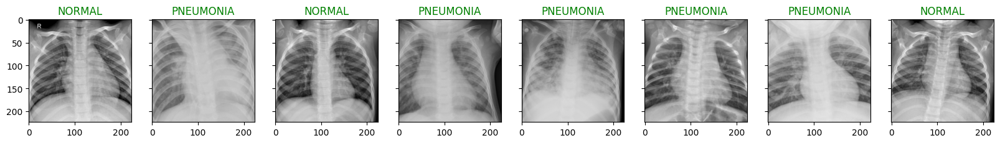

In [ ]:
# Visualizing some training images
n_images = 8

fig, axes = plt.subplots(nrows=1, ncols=n_images, sharex=True, sharey=True, figsize=(20, 2.5))
orig_images = inputs[:n_images]

for ii in range(n_images):
    curr_img = orig_images[ii].detach().to(device)
    curr_img = curr_img.permute((1, 2, 0)).cpu().numpy()

    mean = np.array(mean_values)
    std = np.array(std_values)
    curr_img = std * curr_img + mean
    curr_img = np.clip(curr_img, 0, 1)

    axes[ii].imshow(curr_img)
    axes[ii].set_title('{}'.format(class_names[classes[ii]]), color='green')


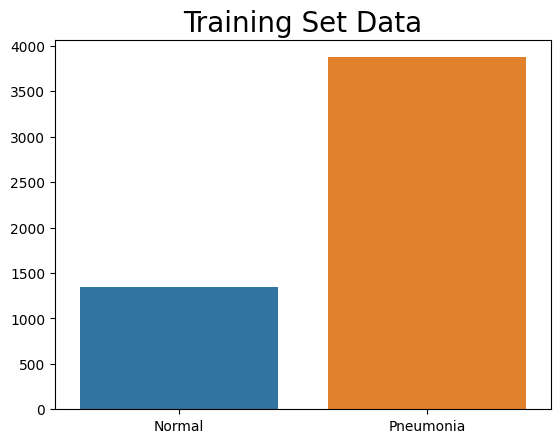

In [ ]:
train_samplesize = pd.DataFrame.from_dict(
    {'Normal': [len([os.path.join(data_dir+'/train/NORMAL', filename)
                     for filename in os.listdir(data_dir+'/train/NORMAL')])],
     'Pneumonia': [len([os.path.join(data_dir+'/train/PNEUMONIA', filename)
                        for filename in os.listdir(data_dir+'/train/PNEUMONIA')])]})


sns.barplot(data=train_samplesize).set_title('Training Set Data', fontsize=20)
plt.show()

## Model Definition (ResNet50)

In [ ]:
class PNEUNOMIA_CNN(torch.nn.Module):
  def __init__(self, num_classes=num_classes):
      super(PNEUNOMIA_CNN, self).__init__()
      self.model = models.resnet50(models.ResNet50_Weights.IMAGENET1K_V1).to(device)
      self.freeze()
      self.classifier = nn.Sequential(
            nn.Linear(self.model.fc.in_features, num_classes),
      )
      self.model.fc = self.classifier

  def freeze(self):
      for parameter in self.model.parameters():
        parameter.requires_grad = False

  def forward(self, x):
      logits = self.model(x)
      probas = torch.softmax(logits, dim=1)
      return logits, probas

In [ ]:
# initialise model
model = PNEUNOMIA_CNN().to(device)

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 68.8MB/s]


In [ ]:
from torchsummary import summary
summary(model.model, input_size=(3, 224, 224))


### Loss function




In [ ]:
#class_weights = class_weight.compute_class_weight('balanced', np.unique(y), y.numpy())
class_weights = torch.tensor([10.0, 1.0],dtype=torch.float)

In [ ]:
f_loss = torch.nn.CrossEntropyLoss(weight=class_weights)

### Optimizer


In [ ]:
optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)
# optimizers = {model_name: optim.SGD(cnn_models[model_name].model.parameters(), lr=learning_rate) for model_name in cnn_models}

### Scheduler


In [ ]:
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=30, gamma=0.1)

### Model Training
- Learning Process:
    1. Put inputs/labels into GPU device.
    2. Do forward propagation => Predictions
    3. Compute Loss function
    4. Do backward propagation => Gradients w.r.t. parameters
    5. Update parameters using gradients
        - `parameters = parameters - learning_rate * parameters_gradients`
    6. REPEAT learning process

In [ ]:
def compute_accuracy_and_loss(model, data_loader, device):

    correct_pred, num_examples = 0, 0

    cross_entropy = 0.

    predictions_arr = []
    targets_arr  = []

    for ii, (features, targets) in enumerate(data_loader):

        features = features.to(device) # x to device
        targets = targets.to(device) # y to device

        logits, probas = model(features) # forward propagation z=logits, a=f(z)
        cross_entropy += F.cross_entropy(logits, targets).item()
        #cross_entropy += F.nll_loss(torch.log(probas), targets)

        _, predicted_labels = torch.max(probas, 1) # y_hat=predicted_labels
        num_examples += targets.size(0)

        correct_pred += (predicted_labels == targets).sum()
        targets_arr.append(targets)
        predictions_arr.append(predicted_labels)

    return correct_pred.float()/num_examples * 100, cross_entropy/num_examples, targets_arr, predictions_arr

In [ ]:
def train(model, num_epochs, dataloaders, dataset_sizes, criterion, optimizer, scheduler, device):
    minibatch_cost = []
    train_acc_lst, valid_acc_lst = [], []
    train_loss_lst, valid_loss_lst = [], []

    best_acc = 0
    best_loss = np.inf

    start_time = time.time()

    # Create StratifiedShuffleSplit object
    sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)

    for epoch in range(num_epochs):
        model.train()

        for batch_idx, (features, targets) in enumerate(dataloaders['train']):
            features = features.to(device)
            targets = targets.to(device)

            # Forward-propagation
            logits, probas = model.forward(features)

            # Compute cost function
            cost = criterion(logits, targets)

            # Clean gradients
            optimizer.zero_grad()

            # Compute derivatives
            cost.backward()

            # Append minibatch cost
            minibatch_cost.append(cost.item())

            # Update model parameters
            optimizer.step()

            # Logging results
            if not batch_idx % 50:
                print('Epoch: %05d/%05d | Batch %05d/%05d | Cost: %.4f'
                      % (epoch + 1, num_epochs, batch_idx, len(dataloaders['train']), cost))

        scheduler.step()

        with torch.set_grad_enabled(False):
            train_acc, train_loss, _, _ = compute_accuracy_and_loss(model, dataloaders['train'], device=device)
            valid_acc, valid_loss, _, _ = compute_accuracy_and_loss(model, dataloaders['val'], device=device)

            print('Epoch: %05d/%05d | Train cost: %.4f | Valid cost: %.4f | Train acc.: %.4f%% | Val.acc.: %.4f%%' % (
                  epoch + 1, num_epochs, train_loss, valid_loss, train_acc, valid_acc))

            train_acc_lst.append(train_acc)
            valid_acc_lst.append(valid_acc)
            train_loss_lst.append(train_loss)
            valid_loss_lst.append(valid_loss)

        print('Time elapsed: %.2f min' % ((time.time() - start_time) / 60))

    print('Total Training Time: %.2f min' % ((time.time() - start_time) / 60))

    return minibatch_cost, train_loss_lst, valid_loss_lst, train_acc_lst, valid_acc_lst


In [ ]:
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Call the train function with all the required arguments
minibatch_cost, train_loss_lst, valid_loss_lst, train_acc_lst, valid_acc_lst = train(model, num_epochs, dataloaders, dataset_sizes, criterion, optimizer, scheduler, device)


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Epoch: 00001/00015 | Batch 00000/00326 | Cost: 0.6074
Epoch: 00001/00015 | Batch 00050/00326 | Cost: 0.1063
Epoch: 00001/00015 | Batch 00100/00326 | Cost: 0.2503
Epoch: 00001/00015 | Batch 00150/00326 | Cost: 0.1275
Epoch: 00001/00015 | Batch 00200/00326 | Cost: 0.1638
Epoch: 00001/00015 | Batch 00250/00326 | Cost: 0.2817
Epoch: 00001/00015 | Batch 00300/00326 | Cost: 0.2879
Epoch: 00001/00015 | Train cost: 0.0110 | Valid cost: 0.0580 | Train acc.: 92.2929% | Val.acc.: 50.0000%
Time elapsed: 2.87 min
Epoch: 00002/00015 | Batch 00000/00326 | Cost: 0.1068
Epoch: 00002/00015 | Batch 00050/00326 | Cost: 0.2005
Epoch: 00002/00015 | Batch 00100/00326 | Cost: 0.1721
Epoch: 00002/00015 | Batch 00150/00326 | Cost: 0.1913
Epoch: 00002/00015 | Batch 00200/00326 | Cost: 0.0806
Epoch: 00002/00015 | Batch 00250/00326 | Cost: 0.1772
Epoch: 00002/00015 | Batch 00300/00326 | Cost: 0.0489
Epoch: 00002/00015 | Train cost: 0.0087 | Valid cost: 0.0442 | Train acc.: 94.4785% | Val.acc.: 56.2500%
Time elapse

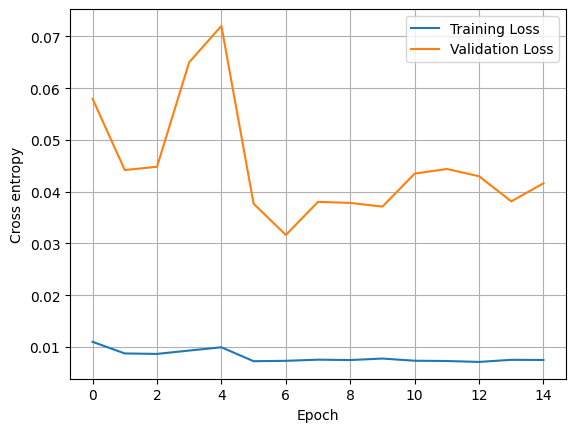

In [ ]:
plt.plot(range(len(train_loss_lst)), (train_loss_lst), label='Training Loss')
plt.plot(range(len(valid_loss_lst)), (valid_loss_lst), label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross entropy')
plt.xlabel('Epoch')
plt.grid()
plt.show()

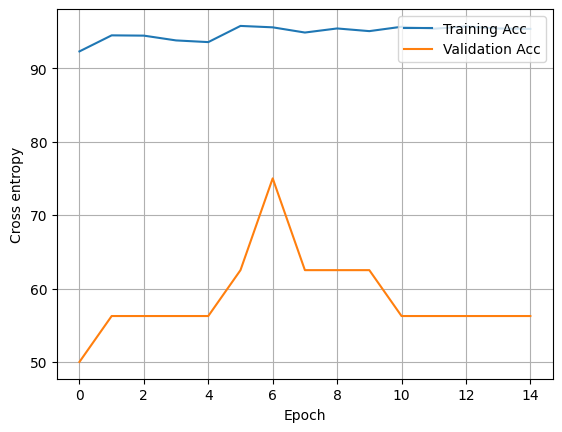

In [ ]:
plt.plot(range(len(train_acc_lst)), [tensor.cpu() for tensor in train_acc_lst], label='Training Acc')
plt.plot(range(len(valid_acc_lst)), [tensor.cpu() for tensor in valid_acc_lst], label='Validation Acc')
# plt.plot(range(len(train_acc_lst)), train_acc_lst, label='Training Acc')
# plt.plot(range(len(valid_acc_lst)), valid_acc_lst, label='Validation Acc')
plt.legend(loc='upper right')
plt.ylabel('Cross entropy')
plt.xlabel('Epoch')
plt.grid()
plt.show()

### Model Evaluation


In [ ]:
test_acc, test_loss, test_targets, test_preds = compute_accuracy_and_loss(model, dataloaders['test'], device) # compute accuracy on test dataset
print('Test accuracy: %.2f%%' % (test_acc))

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Test accuracy: 81.09%


In [ ]:
test_targets = torch.hstack(test_targets).cpu().detach().numpy()
test_preds = torch.hstack(test_preds).cpu().detach().numpy()

In [ ]:
print(test_targets.shape)
print(test_preds.shape)

(624,)
(624,)


<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

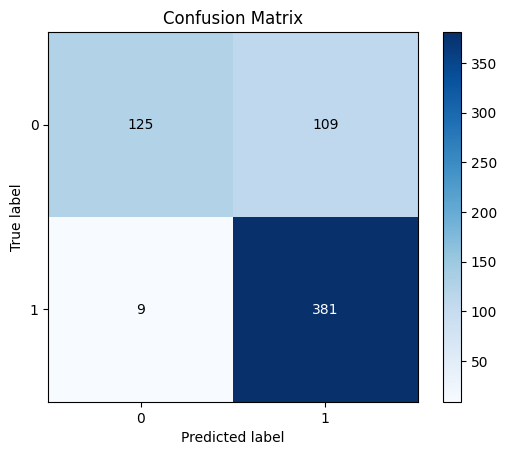

In [ ]:
skplt.metrics.plot_confusion_matrix(test_targets,test_preds, normalize=False)

In [ ]:
for ii in range(len(class_names)):
    correct = ((test_targets == ii)*1) * ((np.array(test_preds) == test_targets)*1)
    print('{}, {}: '.rjust(10).format(ii, class_names[ii]) + '{:.2f}%'.
          format(100*correct.sum()/test_targets[test_targets == ii].shape[0]))

  0, NORMAL: 53.42%
  1, PNEUMONIA: 97.69%


In [ ]:
# obtain one batch of test images
data_iter = iter(dataloaders['test'])
images, targets = next(data_iter)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
# get sample outputs
logits, probas = model(images.to(device))

# convert output probabilities to predicted class
_, preds = torch.max(probas, 1)

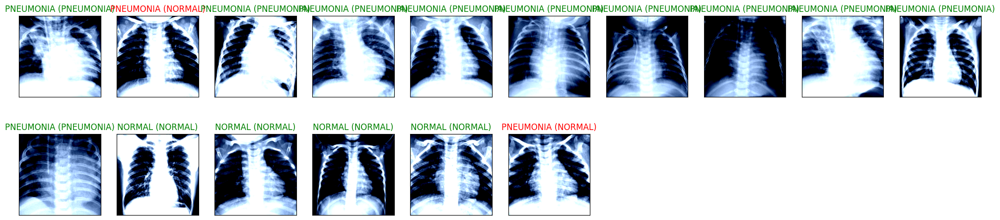

In [ ]:
# Visualise some predicted images
fig = plt.figure(figsize=(25, 15))
for idx in np.arange(len(images)):
    ax = fig.add_subplot(5, 10, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(images[idx].numpy(), (1, 2, 0)))
    ax.set_title("{} ({})".format(class_names[preds[idx]], class_names[targets[idx]]),
                 color=("green" if preds[idx]==targets[idx].item() else "red"))


### Interpretability Using Feature Maps
[Reference](https://ravivaishnav20.medium.com/visualizing-feature-maps-using-pytorch-12a48cd1e573)

In [ ]:
# Gets all the Conv2d layers to visualize how the learn weights look like
model_weights =[]
conv_layers = []
model_children = list(model.model.children())
counter = 0
for i in range(len(model_children)):
    if type(model_children[i]) == nn.Conv2d:
        counter+=1
        model_weights.append(model_children[i].weight)
        conv_layers.append(model_children[i])
    elif type(model_children[i]) == nn.Sequential:
        for j in range(len(model_children[i])):
            for child in model_children[i][j].children():
                if type(child) == nn.Conv2d:
                    counter+=1
                    model_weights.append(child.weight)
                    conv_layers.append(child)

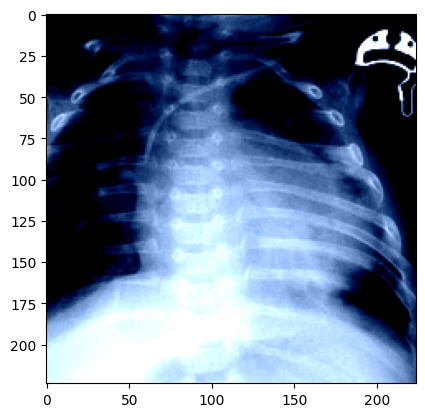

In [ ]:
test_iter = iter(dataloaders['test'])
f_images, f_labels = next(test_iter)
idx = round(random.randint(0, len(f_images) - 1))
f_image = f_images[idx]
plt.imshow(np.transpose(f_image.numpy(), (1, 2, 0)))

In [ ]:
#Iterate over each Conv2d layer to see resulting feature map
outputs = []
names = []
r_image = f_image.to(device)
for layer in conv_layers[0:]:
    r_image = layer(r_image)
    outputs.append(r_image)
    names.append(str(layer))


In [ ]:
#Convert 3D tensor to 2D
processed = []
for feature_map in outputs:
    feature_map = feature_map.squeeze(0)
    gray_scale = torch.sum(feature_map,0)
    gray_scale = gray_scale / feature_map.shape[0]
    processed.append(gray_scale.data.cpu().numpy())

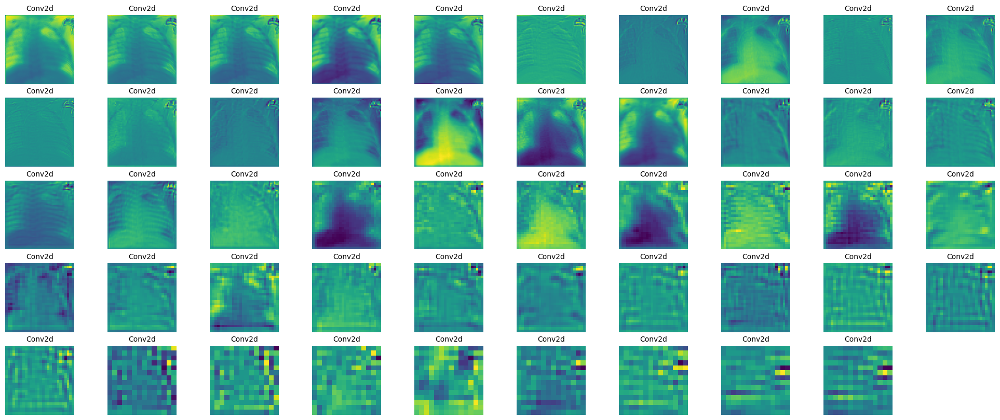

In [ ]:
fig = plt.figure(figsize=(25, 10))
for i in range(len(processed)):
    a = fig.add_subplot(5, 10, i+1)
    imgplot = plt.imshow(processed[i])
    a.axis("off")
    a.set_title(names[i].split('(')[0], fontsize=10)
plt.savefig(str('feature_maps.jpg'), bbox_inches='tight')

### Interpretability using ScoreCAM

In [ ]:
import copy
from pytorch_grad_cam import GradCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from torchvision.models import resnet18
import numpy as np
from PIL import Image
import torch
import torch.nn as nn
import torchvision

In [ ]:
image = (images[4])
print(f"Image shape before: {image.shape}")
image = image.unsqueeze(0)
print(f"Image shape after: {image.shape}")
image = image.to(device)

Image shape before: torch.Size([3, 224, 224])
Image shape after: torch.Size([1, 3, 224, 224])


In [ ]:
rgb_img = transforms.ToPILImage()(image.squeeze(0).cpu())
rgb_img = (rgb_img - np.min(rgb_img)) / (np.max(rgb_img) - np.min(rgb_img))

# Create an input tensor image for your model
#input_tensor = torchvision.transforms.functional.to_tensor(rgb_img).unsqueeze(0).float().to(device)
input_tensor = image
print(type(input_tensor))


# Construct the CAM object once, and then re-use it on many images:
cam = ScoreCAM(model=model.model, target_layers=[model.model.layer4[-1]], use_cuda=True)

grayscale_cam = cam(input_tensor=input_tensor)
grayscale_cam = grayscale_cam[0, :]
visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=False)


<class 'torch.Tensor'>


100%|██████████| 128/128 [00:05<00:00, 21.91it/s]


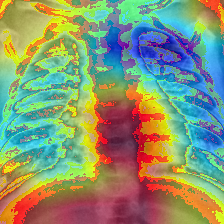

In [ ]:
PIL.Image.fromarray(visualization)

## Model Definition (ResNet101)

In [ ]:
class PNEUNOMIA_CNN(torch.nn.Module):
  def __init__(self, num_classes=num_classes):
      super(PNEUNOMIA_CNN, self).__init__()
      self.model = models.resnet101(models.ResNet101_Weights.IMAGENET1K_V1)
      self.freeze()
      self.classifier = nn.Sequential(
            nn.Linear(self.model.fc.in_features, num_classes),
      )
      self.model.fc = self.classifier

  def freeze(self):
      for parameter in self.model.parameters():
        parameter.requires_grad = False

  def forward(self, x):
      logits = self.model(x)
      probas = torch.softmax(logits, dim=1)
      return logits, probas

In [ ]:
# initialise model
model = PNEUNOMIA_CNN().to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:135: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth
100%|██████████| 171M/171M [00:01<00:00, 100MB/s]


In [ ]:
from torchsummary import summary
summary(model.model, input_size=(3, 224, 224))


### Loss function




In [ ]:
#class_weights = class_weight.compute_class_weight('balanced', np.unique(y), y.numpy())
class_weights = torch.tensor([10.0, 1.0],dtype=torch.float)


In [ ]:
f_loss = torch.nn.CrossEntropyLoss(weight=class_weights)

### Optimizer


In [ ]:
optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)


# optimizers = {model_name: optim.SGD(cnn_models[model_name].model.parameters(), lr=learning_rate) for model_name in cnn_models}

### Scheduler


In [ ]:
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=30, gamma=0.1)

### Model Training


In [ ]:
def compute_accuracy_and_loss(model, data_loader, device):

    correct_pred, num_examples = 0, 0

    cross_entropy = 0.

    predictions_arr = []
    targets_arr  = []

    for ii, (features, targets) in enumerate(data_loader):

        features = features.to(device) # x to device
        targets = targets.to(device) # y to device

        logits, probas = model(features) # forward propagation z=logits, a=f(z)
        cross_entropy += F.cross_entropy(logits, targets).item()
        #cross_entropy += F.nll_loss(torch.log(probas), targets)

        _, predicted_labels = torch.max(probas, 1) # y_hat=predicted_labels
        num_examples += targets.size(0)

        correct_pred += (predicted_labels == targets).sum()
        targets_arr.append(targets)
        predictions_arr.append(predicted_labels)

    return correct_pred.float()/num_examples * 100, cross_entropy/num_examples, targets_arr, predictions_arr

In [ ]:
def train(model, num_epochs, dataloaders, dataset_sizes, criterion, optimizer, scheduler, device):
    minibatch_cost = []
    train_acc_lst, valid_acc_lst = [], []
    train_loss_lst, valid_loss_lst = [], []

    best_acc = 0
    best_loss = np.inf

    start_time = time.time()

    # Create StratifiedShuffleSplit object
    sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)

    for epoch in range(num_epochs):
        model.train()

        for batch_idx, (features, targets) in enumerate(dataloaders['train']):
            features = features.to(device)
            targets = targets.to(device)

            # Forward-propagation
            logits, probas = model.forward(features)

            # Compute cost function
            cost = criterion(logits, targets)

            # Clean gradients
            optimizer.zero_grad()

            # Compute derivatives
            cost.backward()

            # Append minibatch cost
            minibatch_cost.append(cost.item())

            # Update model parameters
            optimizer.step()

            # Logging results
            if not batch_idx % 50:
                print('Epoch: %05d/%05d | Batch %05d/%05d | Cost: %.4f'
                      % (epoch + 1, num_epochs, batch_idx, len(dataloaders['train']), cost))

        scheduler.step()

        with torch.set_grad_enabled(False):
            train_acc, train_loss, _, _ = compute_accuracy_and_loss(model, dataloaders['train'], device=device)
            valid_acc, valid_loss, _, _ = compute_accuracy_and_loss(model, dataloaders['val'], device=device)

            print('Epoch: %05d/%05d | Train cost: %.4f | Valid cost: %.4f | Train acc.: %.4f%% | Val.acc.: %.4f%%' % (
                  epoch + 1, num_epochs, train_loss, valid_loss, train_acc, valid_acc))

            train_acc_lst.append(train_acc)
            valid_acc_lst.append(valid_acc)
            train_loss_lst.append(train_loss)
            valid_loss_lst.append(valid_loss)

        print('Time elapsed: %.2f min' % ((time.time() - start_time) / 60))

    print('Total Training Time: %.2f min' % ((time.time() - start_time) / 60))

    return minibatch_cost, train_loss_lst, valid_loss_lst, train_acc_lst, valid_acc_lst


In [ ]:
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Call the train function with all the required arguments
minibatch_cost, train_loss_lst, valid_loss_lst, train_acc_lst, valid_acc_lst = train(model, num_epochs, dataloaders, dataset_sizes, criterion, optimizer, scheduler, device)


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Epoch: 00001/00015 | Batch 00000/00326 | Cost: 0.7282
Epoch: 00001/00015 | Batch 00050/00326 | Cost: 0.4261
Epoch: 00001/00015 | Batch 00100/00326 | Cost: 0.1348
Epoch: 00001/00015 | Batch 00150/00326 | Cost: 0.1776
Epoch: 00001/00015 | Batch 00200/00326 | Cost: 0.2899
Epoch: 00001/00015 | Batch 00250/00326 | Cost: 0.1374
Epoch: 00001/00015 | Batch 00300/00326 | Cost: 0.2011
Epoch: 00001/00015 | Train cost: 0.0118 | Valid cost: 0.0291 | Train acc.: 92.8681% | Val.acc.: 75.0000%
Time elapsed: 3.06 min
Epoch: 00002/00015 | Batch 00000/00326 | Cost: 0.4740
Epoch: 00002/00015 | Batch 00050/00326 | Cost: 0.1098
Epoch: 00002/00015 | Batch 00100/00326 | Cost: 0.1723
Epoch: 00002/00015 | Batch 00150/00326 | Cost: 0.0946
Epoch: 00002/00015 | Batch 00200/00326 | Cost: 0.2111
Epoch: 00002/00015 | Batch 00250/00326 | Cost: 0.0576
Epoch: 00002/00015 | Batch 00300/00326 | Cost: 0.4098
Epoch: 00002/00015 | Train cost: 0.0084 | Valid cost: 0.0418 | Train acc.: 95.0153% | Val.acc.: 56.2500%
Time elapse

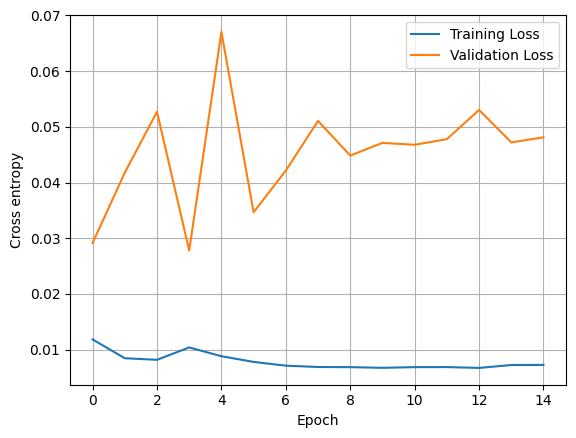

In [ ]:
plt.plot(range(len(train_loss_lst)), (train_loss_lst), label='Training Loss')
plt.plot(range(len(valid_loss_lst)), (valid_loss_lst), label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross entropy')
plt.xlabel('Epoch')
plt.grid()
plt.show()

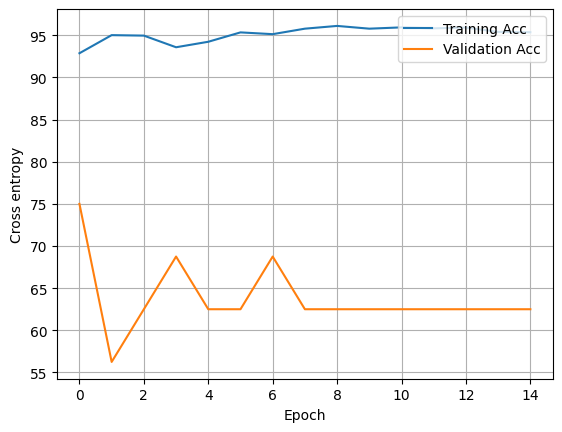

In [ ]:
plt.plot(range(len(train_acc_lst)), [tensor.cpu() for tensor in train_acc_lst], label='Training Acc')
plt.plot(range(len(valid_acc_lst)), [tensor.cpu() for tensor in valid_acc_lst], label='Validation Acc')
# plt.plot(range(len(train_acc_lst)), train_acc_lst, label='Training Acc')
# plt.plot(range(len(valid_acc_lst)), valid_acc_lst, label='Validation Acc')
plt.legend(loc='upper right')
plt.ylabel('Cross entropy')
plt.xlabel('Epoch')
plt.grid()
plt.show()

### Model Evaluation


In [ ]:
test_acc, test_loss, test_targets, test_preds = compute_accuracy_and_loss(model, dataloaders['test'], device) # compute accuracy on test dataset
print('Test accuracy: %.2f%%' % (test_acc))

Test accuracy: 82.69%


In [ ]:
test_targets = torch.hstack(test_targets).cpu().detach().numpy()
test_preds = torch.hstack(test_preds).cpu().detach().numpy()

In [ ]:
print(test_targets.shape)
print(test_preds.shape)

(624,)
(624,)


<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

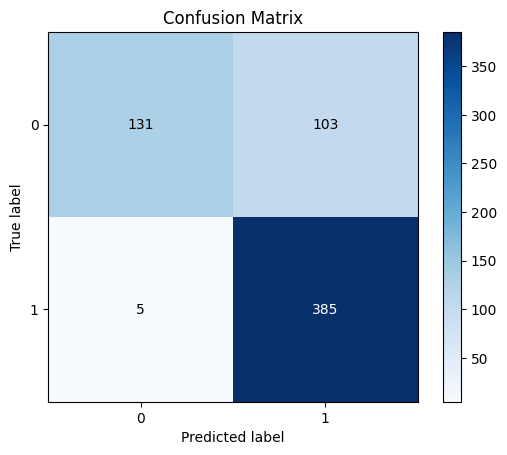

In [ ]:
skplt.metrics.plot_confusion_matrix(test_targets,test_preds, normalize=False)

In [ ]:
for ii in range(len(class_names)):
    correct = ((test_targets == ii)*1) * ((np.array(test_preds) == test_targets)*1)
    print('{}, {}: '.rjust(10).format(ii, class_names[ii]) + '{:.2f}%'.
          format(100*correct.sum()/test_targets[test_targets == ii].shape[0]))

  0, NORMAL: 55.98%
  1, PNEUMONIA: 98.72%


In [ ]:
# obtain one batch of test images
data_iter = iter(dataloaders['test'])
images, targets = next(data_iter)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
# get sample outputs
logits, probas = model(images.to(device))

# convert output probabilities to predicted class
_, preds = torch.max(probas, 1)

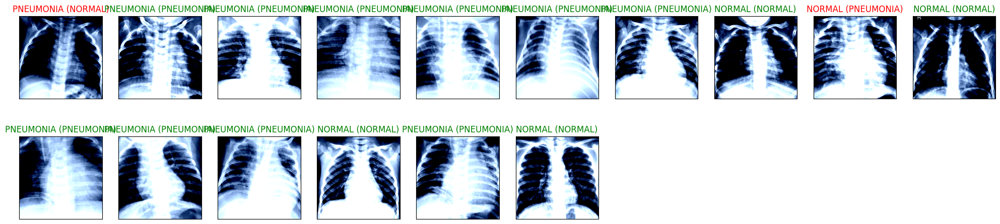

In [ ]:
# Visualise some predicted images
fig = plt.figure(figsize=(25, 15))
for idx in np.arange(len(images)):
    ax = fig.add_subplot(5, 10, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(images[idx].numpy(), (1, 2, 0)))
    ax.set_title("{} ({})".format(class_names[preds[idx]], class_names[targets[idx]]),
                 color=("green" if preds[idx]==targets[idx].item() else "red"))


### Interpretability Using Feature Maps
[Reference](https://ravivaishnav20.medium.com/visualizing-feature-maps-using-pytorch-12a48cd1e573)

In [ ]:
# Gets all the Conv2d layers to visualize how the learn weights look like
model_weights =[]
conv_layers = []
model_children = list(model.model.children())
counter = 0
for i in range(len(model_children)):
    if type(model_children[i]) == nn.Conv2d:
        counter+=1
        model_weights.append(model_children[i].weight)
        conv_layers.append(model_children[i])
    elif type(model_children[i]) == nn.Sequential:
        for j in range(len(model_children[i])):
            for child in model_children[i][j].children():
                if type(child) == nn.Conv2d:
                    counter+=1
                    model_weights.append(child.weight)
                    conv_layers.append(child)

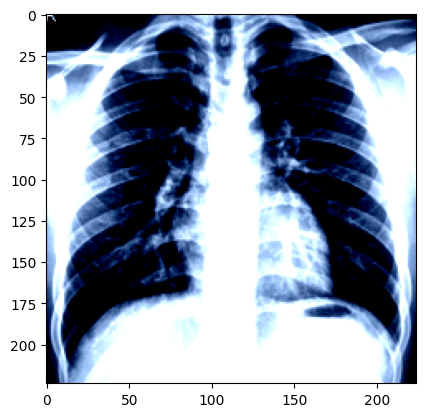

In [ ]:
test_iter = iter(dataloaders['test'])
f_images, f_labels = next(test_iter)
idx = round(random.randint(0, len(f_images) - 1))
f_image = f_images[idx]
plt.imshow(np.transpose(f_image.numpy(), (1, 2, 0)))

In [ ]:
#Iterate over each Conv2d layer to see resulting feature map
outputs = []
names = []
r_image = f_image.to(device)
for layer in conv_layers[0:]:
    r_image = layer(r_image)
    outputs.append(r_image)
    names.append(str(layer))


In [ ]:
#Convert 3D tensor to 2D
processed = []
for feature_map in outputs:
    feature_map = feature_map.squeeze(0)
    gray_scale = torch.sum(feature_map,0)
    gray_scale = gray_scale / feature_map.shape[0]
    processed.append(gray_scale.data.cpu().numpy())

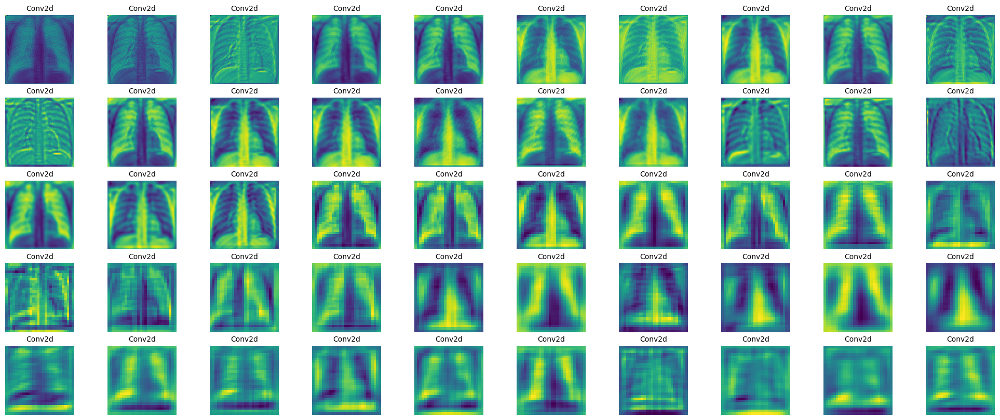

In [ ]:
fig = plt.figure(figsize=(25, 10))
for i in range(min(len(processed), 50)):
    a = fig.add_subplot(5, 10, i+1)
    imgplot = plt.imshow(processed[i])
    a.axis("off")
    a.set_title(names[i].split('(')[0], fontsize=10)

plt.savefig(str('feature_maps.jpg'), bbox_inches='tight')


### Interpretability using ScoreCAM

In [ ]:
import copy
from pytorch_grad_cam import GradCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from torchvision.models import resnet18
import numpy as np
from PIL import Image
import torch
import torch.nn as nn
import torchvision

In [ ]:
image = (images[4])
print(f"Image shape before: {image.shape}")
image = image.unsqueeze(0)
print(f"Image shape after: {image.shape}")
image = image.to(device)

Image shape before: torch.Size([3, 224, 224])
Image shape after: torch.Size([1, 3, 224, 224])


In [ ]:
rgb_img = transforms.ToPILImage()(image.squeeze(0).cpu())
rgb_img = (rgb_img - np.min(rgb_img)) / (np.max(rgb_img) - np.min(rgb_img))

# Create an input tensor image for your model
#input_tensor = torchvision.transforms.functional.to_tensor(rgb_img).unsqueeze(0).float().to(device)
input_tensor = image
print(type(input_tensor))


# Construct the CAM object once, and then re-use it on many images:
cam = ScoreCAM(model=model.model, target_layers=[model.model.layer4[-1]], use_cuda=True)

grayscale_cam = cam(input_tensor=input_tensor)
grayscale_cam = grayscale_cam[0, :]
visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=False)


<class 'torch.Tensor'>


100%|██████████| 128/128 [00:10<00:00, 12.43it/s]


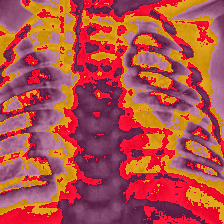

In [ ]:
PIL.Image.fromarray(visualization)

## Model Definition (ResNet152)


In [ ]:
class PNEUNOMIA_CNN(torch.nn.Module):
  def __init__(self, num_classes=num_classes):
      super(PNEUNOMIA_CNN, self).__init__()
      self.model = models.resnet152(models.ResNet152_Weights.IMAGENET1K_V1).to(device)
      self.freeze()
      self.classifier = nn.Sequential(
            nn.Linear(self.model.fc.in_features, num_classes),
      )
      self.model.fc = self.classifier

  def freeze(self):
      for parameter in self.model.parameters():
        parameter.requires_grad = False

  def forward(self, x):
      logits = self.model(x)
      probas = torch.softmax(logits, dim=1)
      return logits, probas

In [ ]:
# initialise model
model = PNEUNOMIA_CNN().to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:135: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(


In [ ]:
from torchsummary import summary
summary(model.model, input_size=(3, 224, 224))

### Loss Function


In [ ]:
#class_weights = class_weight.compute_class_weight('balanced', np.unique(y), y.numpy())
class_weights = torch.tensor([10.0, 1.0],dtype=torch.float)

In [ ]:
f_loss = torch.nn.CrossEntropyLoss(weight=class_weights)

### Optimizer

In [ ]:
optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)

### Scheduler

In [ ]:
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=30, gamma=0.1)

### Model Training

In [ ]:
def compute_accuracy_and_loss(model, data_loader, device):

    correct_pred, num_examples = 0, 0

    cross_entropy = 0.

    predictions_arr = []
    targets_arr  = []

    for ii, (features, targets) in enumerate(data_loader):

        features = features.to(device) # x to device
        targets = targets.to(device) # y to device

        logits, probas = model(features) # forward propagation z=logits, a=f(z)
        cross_entropy += F.cross_entropy(logits, targets).item()
        #cross_entropy += F.nll_loss(torch.log(probas), targets)

        _, predicted_labels = torch.max(probas, 1) # y_hat=predicted_labels
        num_examples += targets.size(0)

        correct_pred += (predicted_labels == targets).sum()
        targets_arr.append(targets)
        predictions_arr.append(predicted_labels)

    return correct_pred.float()/num_examples * 100, cross_entropy/num_examples, targets_arr, predictions_arr

In [ ]:
def train(model, num_epochs, dataloaders, dataset_sizes, criterion, optimizer, scheduler, device):
    minibatch_cost = []
    train_acc_lst, valid_acc_lst = [], []
    train_loss_lst, valid_loss_lst = [], []

    best_acc = 0
    best_loss = np.inf

    start_time = time.time()

    # Create StratifiedShuffleSplit object
    sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)

    for epoch in range(num_epochs):
        model.train()

        for batch_idx, (features, targets) in enumerate(dataloaders['train']):
            features = features.to(device)
            targets = targets.to(device)

            # Forward-propagation
            logits, probas = model.forward(features)

            # Compute cost function
            cost = criterion(logits, targets)

            # Clean gradients
            optimizer.zero_grad()

            # Compute derivatives
            cost.backward()

            # Append minibatch cost
            minibatch_cost.append(cost.item())

            # Update model parameters
            optimizer.step()

            # Logging results
            if not batch_idx % 50:
                print('Epoch: %05d/%05d | Batch %05d/%05d | Cost: %.4f'
                      % (epoch + 1, num_epochs, batch_idx, len(dataloaders['train']), cost))

        scheduler.step()

        with torch.set_grad_enabled(False):
            train_acc, train_loss, _, _ = compute_accuracy_and_loss(model, dataloaders['train'], device=device)
            valid_acc, valid_loss, _, _ = compute_accuracy_and_loss(model, dataloaders['val'], device=device)

            print('Epoch: %05d/%05d | Train cost: %.4f | Valid cost: %.4f | Train acc.: %.4f%% | Val.acc.: %.4f%%' % (
                  epoch + 1, num_epochs, train_loss, valid_loss, train_acc, valid_acc))

            train_acc_lst.append(train_acc)
            valid_acc_lst.append(valid_acc)
            train_loss_lst.append(train_loss)
            valid_loss_lst.append(valid_loss)

        print('Time elapsed: %.2f min' % ((time.time() - start_time) / 60))

    print('Total Training Time: %.2f min' % ((time.time() - start_time) / 60))

    return minibatch_cost, train_loss_lst, valid_loss_lst, train_acc_lst, valid_acc_lst


In [ ]:
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Call the train function with all the required arguments
minibatch_cost, train_loss_lst, valid_loss_lst, train_acc_lst, valid_acc_lst = train(model, num_epochs, dataloaders, dataset_sizes, criterion, optimizer, scheduler, device)


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Epoch: 00001/00015 | Batch 00000/00326 | Cost: 0.6781
Epoch: 00001/00015 | Batch 00050/00326 | Cost: 0.2136
Epoch: 00001/00015 | Batch 00100/00326 | Cost: 0.0511
Epoch: 00001/00015 | Batch 00150/00326 | Cost: 0.4387
Epoch: 00001/00015 | Batch 00200/00326 | Cost: 0.1986
Epoch: 00001/00015 | Batch 00250/00326 | Cost: 0.3255
Epoch: 00001/00015 | Batch 00300/00326 | Cost: 0.0278
Epoch: 00001/00015 | Train cost: 0.0110 | Valid cost: 0.0298 | Train acc.: 93.2132% | Val.acc.: 75.0000%
Time elapsed: 3.17 min
Epoch: 00002/00015 | Batch 00000/00326 | Cost: 0.3098
Epoch: 00002/00015 | Batch 00050/00326 | Cost: 0.2403
Epoch: 00002/00015 | Batch 00100/00326 | Cost: 0.1507
Epoch: 00002/00015 | Batch 00150/00326 | Cost: 0.0636
Epoch: 00002/00015 | Batch 00200/00326 | Cost: 0.2650
Epoch: 00002/00015 | Batch 00250/00326 | Cost: 0.1204
Epoch: 00002/00015 | Batch 00300/00326 | Cost: 0.0814
Epoch: 00002/00015 | Train cost: 0.0088 | Valid cost: 0.0527 | Train acc.: 94.4785% | Val.acc.: 62.5000%
Time elapse

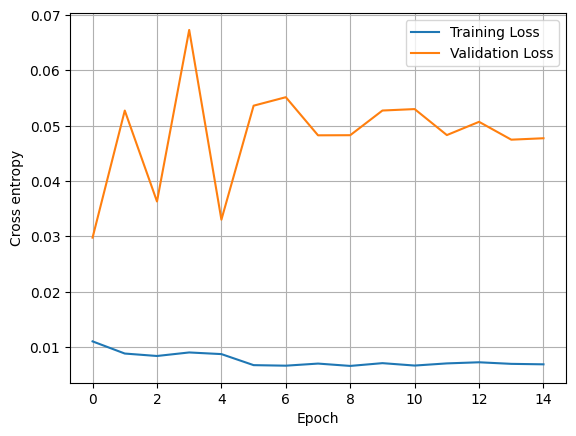

In [ ]:
plt.plot(range(len(train_loss_lst)), (train_loss_lst), label='Training Loss')
plt.plot(range(len(valid_loss_lst)), (valid_loss_lst), label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross entropy')
plt.xlabel('Epoch')
plt.grid()
plt.show()

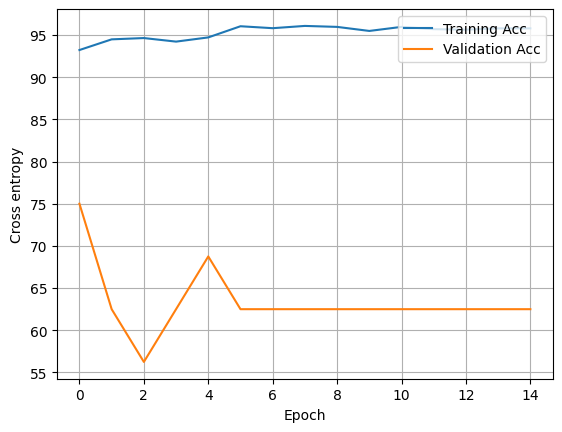

In [ ]:
plt.plot(range(len(train_acc_lst)), [tensor.cpu() for tensor in train_acc_lst], label='Training Acc')
plt.plot(range(len(valid_acc_lst)), [tensor.cpu() for tensor in valid_acc_lst], label='Validation Acc')
# plt.plot(range(len(train_acc_lst)), train_acc_lst, label='Training Acc')
# plt.plot(range(len(valid_acc_lst)), valid_acc_lst, label='Validation Acc')
plt.legend(loc='upper right')
plt.ylabel('Cross entropy')
plt.xlabel('Epoch')
plt.grid()
plt.show()

### Model Evaluation


In [ ]:
test_acc, test_loss, test_targets, test_preds = compute_accuracy_and_loss(model, dataloaders['test'], device) # compute accuracy on test dataset
print('Test accuracy: %.2f%%' % (test_acc))

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Test accuracy: 81.57%


In [ ]:
test_targets = torch.hstack(test_targets).cpu().detach().numpy()
test_preds = torch.hstack(test_preds).cpu().detach().numpy()

In [ ]:
print(test_targets.shape)
print(test_preds.shape)

(624,)
(624,)


<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

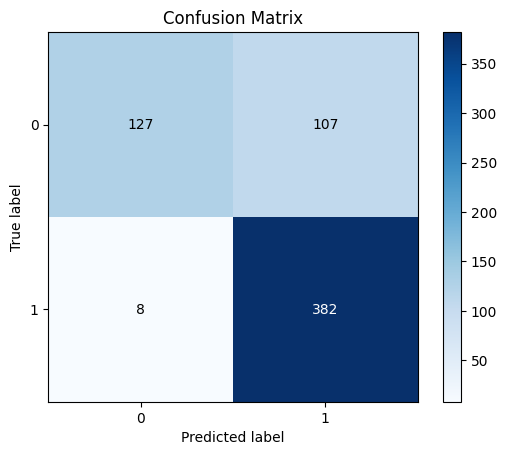

In [ ]:
skplt.metrics.plot_confusion_matrix(test_targets,test_preds, normalize=False)

In [ ]:
for ii in range(len(class_names)):
    correct = ((test_targets == ii)*1) * ((np.array(test_preds) == test_targets)*1)
    print('{}, {}: '.rjust(10).format(ii, class_names[ii]) + '{:.2f}%'.
          format(100*correct.sum()/test_targets[test_targets == ii].shape[0]))

  0, NORMAL: 54.27%
  1, PNEUMONIA: 97.95%


In [ ]:
# obtain one batch of test images
data_iter = iter(dataloaders['test'])
images, targets = next(data_iter)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
# get sample outputs
logits, probas = model(images.to(device))

# convert output probabilities to predicted class
_, preds = torch.max(probas, 1)

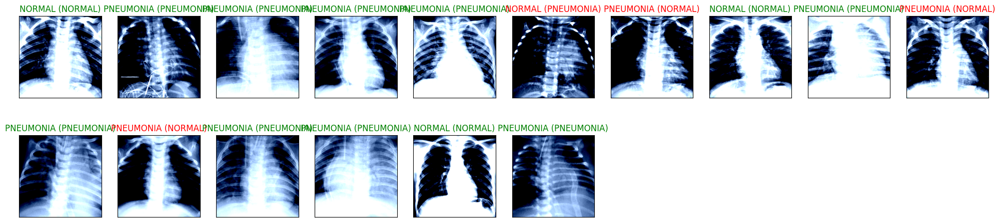

In [ ]:
fig = plt.figure(figsize=(25, 15))
for idx in np.arange(len(images)):
    ax = fig.add_subplot(5, 10, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(images[idx].numpy(), (1, 2, 0)))
    ax.set_title("{} ({})".format(class_names[preds[idx]], class_names[targets[idx]]),
                 color=("green" if preds[idx]==targets[idx].item() else "red"))

### Interpretability Using Feature Maps
[Reference](https://ravivaishnav20.medium.com/visualizing-feature-maps-using-pytorch-12a48cd1e573)

In [ ]:
# Gets all the Conv2d layers to visualize how the learn weights look like
model_weights =[]
conv_layers = []
model_children = list(model.model.children())
counter = 0
for i in range(len(model_children)):
    if type(model_children[i]) == nn.Conv2d:
        counter+=1
        model_weights.append(model_children[i].weight)
        conv_layers.append(model_children[i])
    elif type(model_children[i]) == nn.Sequential:
        for j in range(len(model_children[i])):
            for child in model_children[i][j].children():
                if type(child) == nn.Conv2d:
                    counter+=1
                    model_weights.append(child.weight)
                    conv_layers.append(child)

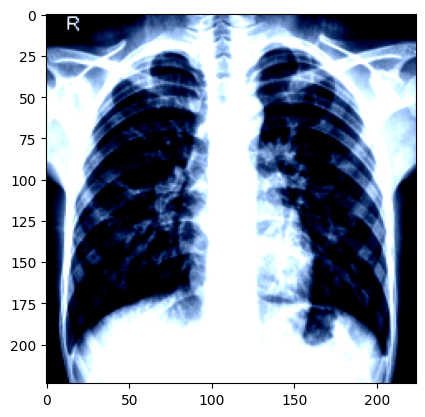

In [ ]:
test_iter = iter(dataloaders['test'])
f_images, f_labels = next(test_iter)
idx = round(random.randint(0, len(f_images) - 1))
f_image = f_images[idx]
plt.imshow(np.transpose(f_image.numpy(), (1, 2, 0)))

In [ ]:
#Iterate over each Conv2d layer to see resulting feature map
outputs = []
names = []
r_image = f_image.to(device)
for layer in conv_layers[0:]:
    r_image = layer(r_image)
    outputs.append(r_image)
    names.append(str(layer))


In [ ]:
#Convert 3D tensor to 2D
processed = []
for feature_map in outputs:
    feature_map = feature_map.squeeze(0)
    gray_scale = torch.sum(feature_map,0)
    gray_scale = gray_scale / feature_map.shape[0]
    processed.append(gray_scale.data.cpu().numpy())

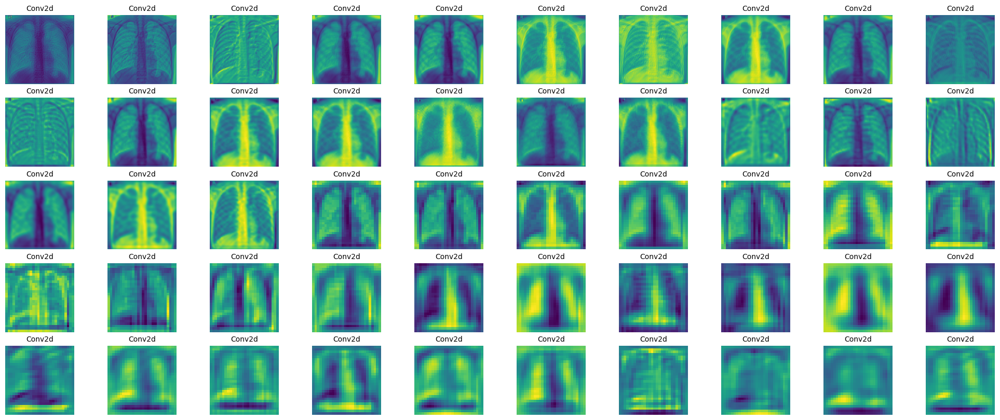

In [ ]:
fig = plt.figure(figsize=(25, 10))
for i in range(min(len(processed), 50)):
    a = fig.add_subplot(5, 10, i+1)
    imgplot = plt.imshow(processed[i])
    a.axis("off")
    a.set_title(names[i].split('(')[0], fontsize=10)
plt.savefig(str('feature_maps.jpg'), bbox_inches='tight')

### Interpretability using ScoreCAM

In [ ]:
import copy
from pytorch_grad_cam import GradCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from torchvision.models import resnet18
import numpy as np
from PIL import Image
import torch
import torch.nn as nn
import torchvision

In [ ]:
image = (images[4])
print(f"Image shape before: {image.shape}")
image = image.unsqueeze(0)
print(f"Image shape after: {image.shape}")
image = image.to(device)

Image shape before: torch.Size([3, 224, 224])
Image shape after: torch.Size([1, 3, 224, 224])


In [ ]:
rgb_img = transforms.ToPILImage()(image.squeeze(0).cpu())
rgb_img = (rgb_img - np.min(rgb_img)) / (np.max(rgb_img) - np.min(rgb_img))

# Create an input tensor image for your model
#input_tensor = torchvision.transforms.functional.to_tensor(rgb_img).unsqueeze(0).float().to(device)
input_tensor = image
print(type(input_tensor))


# Construct the CAM object once, and then re-use it on many images:
cam = ScoreCAM(model=model.model, target_layers=[model.model.layer4[-1]], use_cuda=True)

grayscale_cam = cam(input_tensor=input_tensor)
grayscale_cam = grayscale_cam[0, :]
visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=False)


<class 'torch.Tensor'>


100%|██████████| 128/128 [00:10<00:00, 12.30it/s]


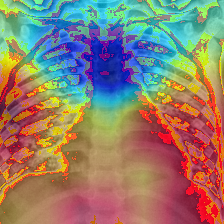

In [ ]:
PIL.Image.fromarray(visualization)

## Model Definition (GoogLeNet)


In [ ]:
class PNEUNOMIA_CNN(torch.nn.Module):
  def __init__(self, num_classes=num_classes):
      super(PNEUNOMIA_CNN, self).__init__()
      self.model = torchvision.models.googlenet(models.GoogLeNet_Weights.IMAGENET1K_V1)
      self.freeze()
      self.classifier = nn.Sequential(
            nn.Linear(self.model.fc.in_features, num_classes),
      )
      self.model.fc = self.classifier

  def freeze(self):
      for parameter in self.model.parameters():
        parameter.requires_grad = False

  def forward(self, x):
      logits = self.model(x)
      probas = torch.softmax(logits, dim=1)
      return logits, probas

In [ ]:
# initialise model
model = PNEUNOMIA_CNN().to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:135: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
Downloading: "https://download.pytorch.org/models/googlenet-1378be20.pth" to /root/.cache/torch/hub/checkpoints/googlenet-1378be20.pth
100%|██████████| 49.7M/49.7M [00:00<00:00, 63.1MB/s]


In [ ]:
from torchsummary import summary
summary(model.model, input_size=(3, 224, 224))

### Loss Function


In [ ]:
#class_weights = class_weight.compute_class_weight('balanced', np.unique(y), y.numpy())
class_weights = torch.tensor([10.0, 1.0],dtype=torch.float)

In [ ]:
f_loss = torch.nn.CrossEntropyLoss(weight=class_weights)

### Optimizer

In [ ]:
optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)

### Scheduler

In [ ]:
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=30, gamma=0.1)

### Model Training

In [ ]:
def compute_accuracy_and_loss(model, data_loader, device):

    correct_pred, num_examples = 0, 0

    cross_entropy = 0.

    predictions_arr = []
    targets_arr  = []

    for ii, (features, targets) in enumerate(data_loader):

        features = features.to(device) # x to device
        targets = targets.to(device) # y to device

        logits, probas = model(features) # forward propagation z=logits, a=f(z)
        cross_entropy += F.cross_entropy(logits, targets).item()
        #cross_entropy += F.nll_loss(torch.log(probas), targets)

        _, predicted_labels = torch.max(probas, 1) # y_hat=predicted_labels
        num_examples += targets.size(0)

        correct_pred += (predicted_labels == targets).sum()
        targets_arr.append(targets)
        predictions_arr.append(predicted_labels)

    return correct_pred.float()/num_examples * 100, cross_entropy/num_examples, targets_arr, predictions_arr

In [ ]:
def train(model, num_epochs, dataloaders, dataset_sizes, criterion, optimizer, scheduler, device):
    minibatch_cost = []
    train_acc_lst, valid_acc_lst = [], []
    train_loss_lst, valid_loss_lst = [], []

    best_acc = 0
    best_loss = np.inf

    start_time = time.time()

    # Create StratifiedShuffleSplit object
    sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)

    for epoch in range(num_epochs):
        model.train()

        for batch_idx, (features, targets) in enumerate(dataloaders['train']):
            features = features.to(device)
            targets = targets.to(device)

            # Forward-propagation
            logits, probas = model.forward(features)

            # Compute cost function
            cost = criterion(logits, targets)

            # Clean gradients
            optimizer.zero_grad()

            # Compute derivatives
            cost.backward()

            # Append minibatch cost
            minibatch_cost.append(cost.item())

            # Update model parameters
            optimizer.step()

            # Logging results
            if not batch_idx % 50:
                print('Epoch: %05d/%05d | Batch %05d/%05d | Cost: %.4f'
                      % (epoch + 1, num_epochs, batch_idx, len(dataloaders['train']), cost))

        scheduler.step()

        with torch.set_grad_enabled(False):
            train_acc, train_loss, _, _ = compute_accuracy_and_loss(model, dataloaders['train'], device=device)
            valid_acc, valid_loss, _, _ = compute_accuracy_and_loss(model, dataloaders['val'], device=device)

            print('Epoch: %05d/%05d | Train cost: %.4f | Valid cost: %.4f | Train acc.: %.4f%% | Val.acc.: %.4f%%' % (
                  epoch + 1, num_epochs, train_loss, valid_loss, train_acc, valid_acc))

            train_acc_lst.append(train_acc)
            valid_acc_lst.append(valid_acc)
            train_loss_lst.append(train_loss)
            valid_loss_lst.append(valid_loss)

        print('Time elapsed: %.2f min' % ((time.time() - start_time) / 60))

    print('Total Training Time: %.2f min' % ((time.time() - start_time) / 60))

    return minibatch_cost, train_loss_lst, valid_loss_lst, train_acc_lst, valid_acc_lst


In [ ]:
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Call the train function with all the required arguments
minibatch_cost, train_loss_lst, valid_loss_lst, train_acc_lst, valid_acc_lst = train(model, num_epochs, dataloaders, dataset_sizes, criterion, optimizer, scheduler, device)


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Epoch: 00001/00015 | Batch 00000/00326 | Cost: 0.7122
Epoch: 00001/00015 | Batch 00050/00326 | Cost: 0.2540
Epoch: 00001/00015 | Batch 00100/00326 | Cost: 0.4249
Epoch: 00001/00015 | Batch 00150/00326 | Cost: 0.8303
Epoch: 00001/00015 | Batch 00200/00326 | Cost: 0.1590
Epoch: 00001/00015 | Batch 00250/00326 | Cost: 0.1825
Epoch: 00001/00015 | Batch 00300/00326 | Cost: 0.1594
Epoch: 00001/00015 | Train cost: 0.0132 | Valid cost: 0.0465 | Train acc.: 92.4271% | Val.acc.: 56.2500%
Time elapsed: 3.04 min
Epoch: 00002/00015 | Batch 00000/00326 | Cost: 0.3291
Epoch: 00002/00015 | Batch 00050/00326 | Cost: 0.0876
Epoch: 00002/00015 | Batch 00100/00326 | Cost: 0.3038
Epoch: 00002/00015 | Batch 00150/00326 | Cost: 0.2093
Epoch: 00002/00015 | Batch 00200/00326 | Cost: 0.2758
Epoch: 00002/00015 | Batch 00250/00326 | Cost: 0.2173
Epoch: 00002/00015 | Batch 00300/00326 | Cost: 0.2391
Epoch: 00002/00015 | Train cost: 0.0131 | Valid cost: 0.0680 | Train acc.: 91.0659% | Val.acc.: 56.2500%
Time elapse

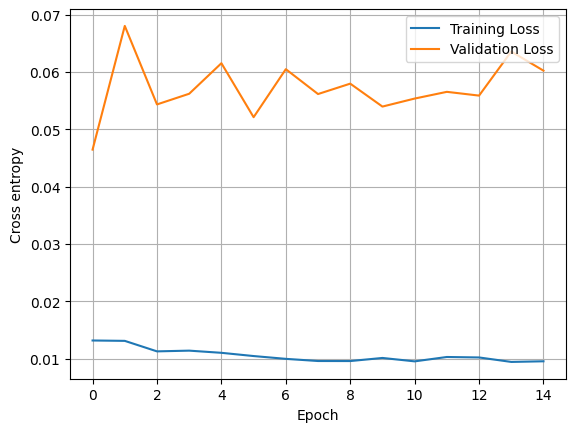

In [ ]:
plt.plot(range(len(train_loss_lst)), (train_loss_lst), label='Training Loss')
plt.plot(range(len(valid_loss_lst)), (valid_loss_lst), label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross entropy')
plt.xlabel('Epoch')
plt.grid()
plt.show()

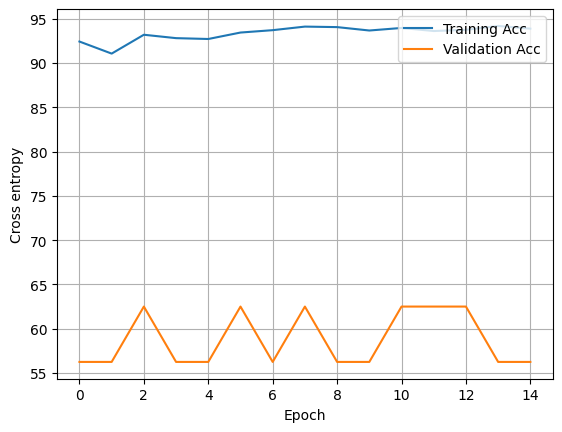

In [ ]:
plt.plot(range(len(train_acc_lst)), [tensor.cpu() for tensor in train_acc_lst], label='Training Acc')
plt.plot(range(len(valid_acc_lst)), [tensor.cpu() for tensor in valid_acc_lst], label='Validation Acc')
# plt.plot(range(len(train_acc_lst)), train_acc_lst, label='Training Acc')
# plt.plot(range(len(valid_acc_lst)), valid_acc_lst, label='Validation Acc')
plt.legend(loc='upper right')
plt.ylabel('Cross entropy')
plt.xlabel('Epoch')
plt.grid()
plt.show()

### Model Evaluation


In [ ]:
test_acc, test_loss, test_targets, test_preds = compute_accuracy_and_loss(model, dataloaders['test'], device) # compute accuracy on test dataset
print('Test accuracy: %.2f%%' % (test_acc))

Test accuracy: 81.73%


In [ ]:
test_targets = torch.hstack(test_targets).cpu().detach().numpy()
test_preds = torch.hstack(test_preds).cpu().detach().numpy()

In [ ]:
print(test_targets.shape)
print(test_preds.shape)

(624,)
(624,)


<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

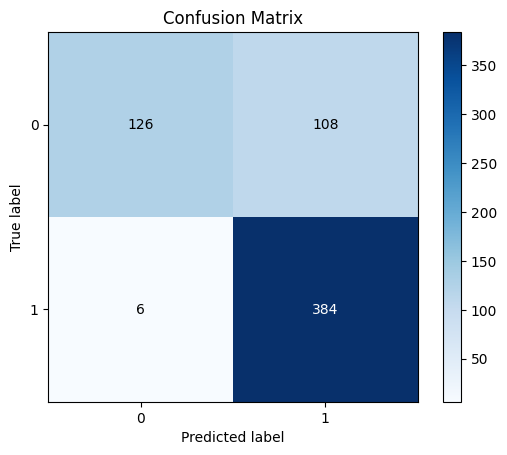

In [ ]:
skplt.metrics.plot_confusion_matrix(test_targets,test_preds, normalize=False)

In [ ]:
for ii in range(len(class_names)):
    correct = ((test_targets == ii)*1) * ((np.array(test_preds) == test_targets)*1)
    print('{}, {}: '.rjust(10).format(ii, class_names[ii]) + '{:.2f}%'.
          format(100*correct.sum()/test_targets[test_targets == ii].shape[0]))

  0, NORMAL: 53.85%
  1, PNEUMONIA: 98.46%


In [ ]:
# obtain one batch of test images
data_iter = iter(dataloaders['test'])
images, targets = next(data_iter)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
# get sample outputs
logits, probas = model(images.to(device))

# convert output probabilities to predicted class
_, preds = torch.max(probas, 1)

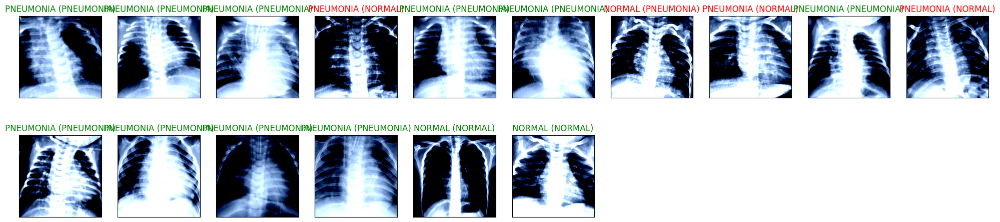

In [ ]:
fig = plt.figure(figsize=(25, 15))
for idx in np.arange(len(images)):
    ax = fig.add_subplot(5, 10, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(images[idx].numpy(), (1, 2, 0)))
    ax.set_title("{} ({})".format(class_names[preds[idx]], class_names[targets[idx]]),
                 color=("green" if preds[idx]==targets[idx].item() else "red"))

### Interpretability Using Feature Maps
[Reference](https://ravivaishnav20.medium.com/visualizing-feature-maps-using-pytorch-12a48cd1e573)

In [ ]:
# Gets all the Conv2d layers to visualize how the learn weights look like
model_weights =[]
conv_layers = []
model_children = list(model.model.children())
counter = 0
for i in range(len(model_children)):
    if type(model_children[i]) == nn.Conv2d:
        counter+=1
        model_weights.append(model_children[i].weight)
        conv_layers.append(model_children[i])
    elif type(model_children[i]) == nn.Sequential:
        for j in range(len(model_children[i])):
            for child in model_children[i][j].children():
                if type(child) == nn.Conv2d:
                    counter+=1
                    model_weights.append(child.weight)
                    conv_layers.append(child)

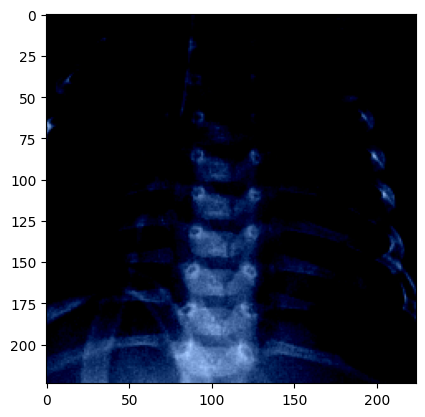

In [ ]:
test_iter = iter(dataloaders['test'])
f_images, f_labels = next(test_iter)
idx = round(random.randint(0, len(f_images) - 1))
f_image = f_images[idx]
plt.imshow(np.transpose(f_image.numpy(), (1, 2, 0)))

In [ ]:
#Iterate over each Conv2d layer to see resulting feature map
outputs = []
names = []
r_image = f_image.to(device)
for layer in conv_layers[0:]:
    r_image = layer(r_image)
    outputs.append(r_image)
    names.append(str(layer))


In [ ]:
#Convert 3D tensor to 2D
processed = []
for feature_map in outputs:
    feature_map = feature_map.squeeze(0)
    gray_scale = torch.sum(feature_map,0)
    gray_scale = gray_scale / feature_map.shape[0]
    processed.append(gray_scale.data.cpu().numpy())

In [ ]:
fig = plt.figure(figsize=(30, 50))
for i in range(len(processed)):
    a = fig.add_subplot(5, 4, i+1)
    imgplot = plt.imshow(processed[i])
    a.axis("off")
    a.set_title(names[i].split('(')[0], fontsize=30)
plt.savefig(str('feature_maps.jpg'), bbox_inches='tight')

<Figure size 3000x5000 with 0 Axes>

## Model Definition (EfficientNetv2)

In [ ]:
pip install timm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 33.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 38.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 77.6 MB/s eta 0:00:00


In [ ]:
import torch
import timm

class PNEUNOMIA_CNN(torch.nn.Module):
    def __init__(self, num_classes=num_classes):
        super(PNEUNOMIA_CNN, self).__init__()
        # Load pre-trained EfficientNet model (for example, 'efficientnet_b0')
        self.model = timm.create_model('efficientnet_b0', pretrained=True)
        # Modify the classifier to match the number of output classes
        self.model.classifier = torch.nn.Linear(self.model.classifier.in_features, num_classes)
        self.freeze()

    def freeze(self):
        for parameter in self.model.parameters():
            parameter.requires_grad = False

    def forward(self, x):
        # Ensure that x requires gradients
        x.requires_grad_(True)
        logits = self.model(x)
        probas = torch.softmax(logits, dim=1)
        return logits, probas

# Initialize the model with the specified number of classes
model = PNEUNOMIA_CNN(num_classes=num_classes).to(device)


model.safetensors:   0%|          | 0.00/21.4M [00:00<?, ?B/s]

In [ ]:
from torchsummary import summary
summary(model.model, input_size=(3, 224, 224))

### Loss function




In [ ]:
#class_weights = class_weight.compute_class_weight('balanced', np.unique(y), y.numpy())
class_weights = torch.tensor([10.0, 1.0],dtype=torch.float)


In [ ]:
f_loss = torch.nn.CrossEntropyLoss(weight=class_weights)

### Optimizer


In [ ]:
optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)


# optimizers = {model_name: optim.SGD(cnn_models[model_name].model.parameters(), lr=learning_rate) for model_name in cnn_models}

### Scheduler


In [ ]:
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=30, gamma=0.1)

### Model Training


In [ ]:
def compute_accuracy_and_loss(model, data_loader, device):

    correct_pred, num_examples = 0, 0

    cross_entropy = 0.

    predictions_arr = []
    targets_arr  = []

    for ii, (features, targets) in enumerate(data_loader):

        features = features.to(device) # x to device
        targets = targets.to(device) # y to device

        logits, probas = model(features) # forward propagation z=logits, a=f(z)
        cross_entropy += F.cross_entropy(logits, targets).item()
        #cross_entropy += F.nll_loss(torch.log(probas), targets)

        _, predicted_labels = torch.max(probas, 1) # y_hat=predicted_labels
        num_examples += targets.size(0)

        correct_pred += (predicted_labels == targets).sum()
        targets_arr.append(targets)
        predictions_arr.append(predicted_labels)

    return correct_pred.float()/num_examples * 100, cross_entropy/num_examples, targets_arr, predictions_arr

In [ ]:
def train(model, num_epochs, dataloaders, dataset_sizes, criterion, optimizer, scheduler, device):
    minibatch_cost = []
    train_acc_lst, valid_acc_lst = [], []
    train_loss_lst, valid_loss_lst = [], []

    best_acc = 0
    best_loss = np.inf

    start_time = time.time()

    # Create StratifiedShuffleSplit object
    sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)

    for epoch in range(num_epochs):
        model.train()

        for batch_idx, (features, targets) in enumerate(dataloaders['train']):
            features = features.to(device)
            targets = targets.to(device)

            # Forward-propagation
            logits, probas = model.forward(features)

            # Compute cost function
            cost = criterion(logits, targets)

            # Clean gradients
            optimizer.zero_grad()

            # Compute derivatives
            cost.backward()

            # Append minibatch cost
            minibatch_cost.append(cost.item())

            # Update model parameters
            optimizer.step()

            # Logging results
            if not batch_idx % 50:
                print('Epoch: %05d/%05d | Batch %05d/%05d | Cost: %.4f'
                      % (epoch + 1, num_epochs, batch_idx, len(dataloaders['train']), cost))

        scheduler.step()

        with torch.set_grad_enabled(False):
            train_acc, train_loss, _, _ = compute_accuracy_and_loss(model, dataloaders['train'], device=device)
            valid_acc, valid_loss, _, _ = compute_accuracy_and_loss(model, dataloaders['val'], device=device)

            print('Epoch: %05d/%05d | Train cost: %.4f | Valid cost: %.4f | Train acc.: %.4f%% | Val.acc.: %.4f%%' % (
                  epoch + 1, num_epochs, train_loss, valid_loss, train_acc, valid_acc))

            train_acc_lst.append(train_acc)
            valid_acc_lst.append(valid_acc)
            train_loss_lst.append(train_loss)
            valid_loss_lst.append(valid_loss)

        print('Time elapsed: %.2f min' % ((time.time() - start_time) / 60))

    print('Total Training Time: %.2f min' % ((time.time() - start_time) / 60))

    return minibatch_cost, train_loss_lst, valid_loss_lst, train_acc_lst, valid_acc_lst


In [ ]:
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Call the train function with all the required arguments
minibatch_cost, train_loss_lst, valid_loss_lst, train_acc_lst, valid_acc_lst = train(model, num_epochs, dataloaders, dataset_sizes, criterion, optimizer, scheduler, device)


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Epoch: 00001/00015 | Batch 00000/00326 | Cost: 0.7126
Epoch: 00001/00015 | Batch 00050/00326 | Cost: 0.6887
Epoch: 00001/00015 | Batch 00100/00326 | Cost: 0.7003
Epoch: 00001/00015 | Batch 00150/00326 | Cost: 0.6588
Epoch: 00001/00015 | Batch 00200/00326 | Cost: 0.6466
Epoch: 00001/00015 | Batch 00250/00326 | Cost: 0.6965
Epoch: 00001/00015 | Batch 00300/00326 | Cost: 0.6602
Epoch: 00001/00015 | Train cost: 0.0423 | Valid cost: 0.0462 | Train acc.: 58.9340% | Val.acc.: 31.2500%
Time elapsed: 3.07 min
Epoch: 00002/00015 | Batch 00000/00326 | Cost: 0.6587
Epoch: 00002/00015 | Batch 00050/00326 | Cost: 0.6950
Epoch: 00002/00015 | Batch 00100/00326 | Cost: 0.6818
Epoch: 00002/00015 | Batch 00150/00326 | Cost: 0.6851
Epoch: 00002/00015 | Batch 00200/00326 | Cost: 0.6853
Epoch: 00002/00015 | Batch 00250/00326 | Cost: 0.6766
Epoch: 00002/00015 | Batch 00300/00326 | Cost: 0.6513
Epoch: 00002/00015 | Train cost: 0.0424 | Valid cost: 0.0462 | Train acc.: 58.4356% | Val.acc.: 31.2500%
Time elapse

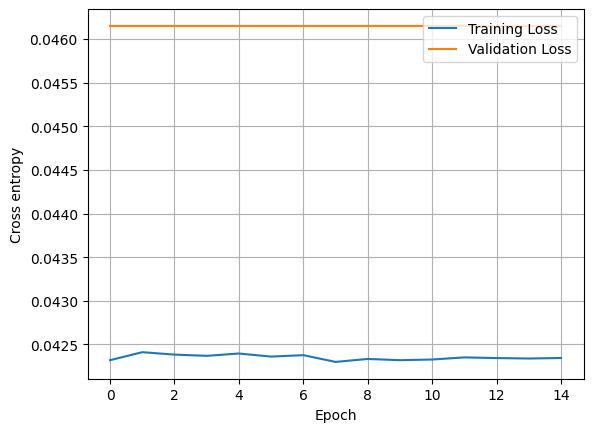

In [ ]:
plt.plot(range(len(train_loss_lst)), (train_loss_lst), label='Training Loss')
plt.plot(range(len(valid_loss_lst)), (valid_loss_lst), label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross entropy')
plt.xlabel('Epoch')
plt.grid()
plt.show()

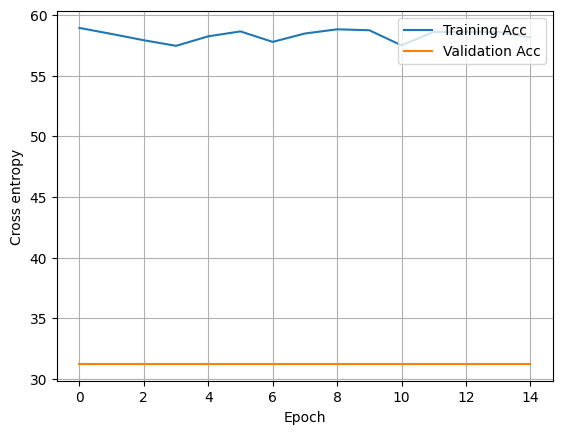

In [ ]:
plt.plot(range(len(train_acc_lst)), [tensor.cpu() for tensor in train_acc_lst], label='Training Acc')
plt.plot(range(len(valid_acc_lst)), [tensor.cpu() for tensor in valid_acc_lst], label='Validation Acc')
# plt.plot(range(len(train_acc_lst)), train_acc_lst, label='Training Acc')
# plt.plot(range(len(valid_acc_lst)), valid_acc_lst, label='Validation Acc')
plt.legend(loc='upper right')
plt.ylabel('Cross entropy')
plt.xlabel('Epoch')
plt.grid()
plt.show()

### Model Evaluation


In [ ]:
test_acc, test_loss, test_targets, test_preds = compute_accuracy_and_loss(model, dataloaders['test'], device) # compute accuracy on test dataset
print('Test accuracy: %.2f%%' % (test_acc))

Test accuracy: 54.65%


In [ ]:
print(test_targets.shape)
print(test_preds.shape)

(624,)
(624,)


<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

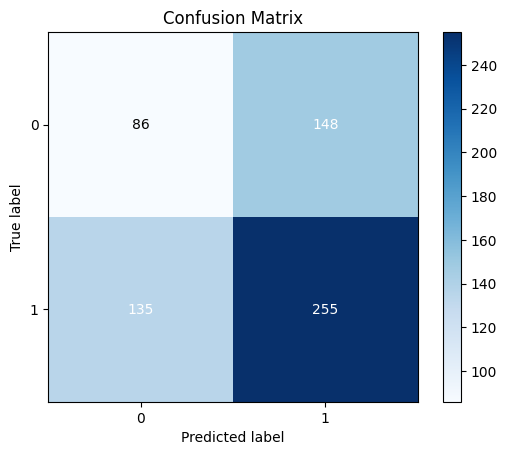

In [ ]:
skplt.metrics.plot_confusion_matrix(test_targets,test_preds, normalize=False)

In [ ]:
for ii in range(len(class_names)):
    correct = ((test_targets == ii)*1) * ((np.array(test_preds) == test_targets)*1)
    print('{}, {}: '.rjust(10).format(ii, class_names[ii]) + '{:.2f}%'.
          format(100*correct.sum()/test_targets[test_targets == ii].shape[0]))

  0, NORMAL: 36.75%
  1, PNEUMONIA: 65.38%


In [ ]:
# obtain one batch of test images
data_iter = iter(dataloaders['test'])
images, targets = next(data_iter)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
# get sample outputs
logits, probas = model(images.to(device))

# convert output probabilities to predicted class
_, preds = torch.max(probas, 1)

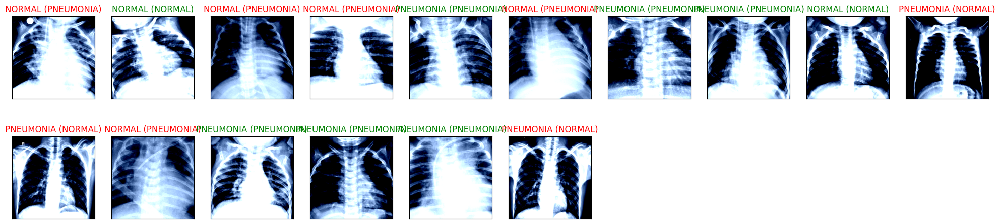

In [ ]:
# Visualise some predicted images
fig = plt.figure(figsize=(25, 15))
for idx in np.arange(len(images)):
    ax = fig.add_subplot(5, 10, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(images[idx].numpy(), (1, 2, 0)))
    ax.set_title("{} ({})".format(class_names[preds[idx]], class_names[targets[idx]]),
                 color=("green" if preds[idx]==targets[idx].item() else "red"))


### Interpretability Using Feature Maps
[Reference](https://ravivaishnav20.medium.com/visualizing-feature-maps-using-pytorch-12a48cd1e573)

In [ ]:
# Gets all the Conv2d layers to visualize how the learn weights look like
model_weights =[]
conv_layers = []
model_children = list(model.model.children())
counter = 0
for i in range(len(model_children)):
    if type(model_children[i]) == nn.Conv2d:
        counter+=1
        model_weights.append(model_children[i].weight)
        conv_layers.append(model_children[i])
    elif type(model_children[i]) == nn.Sequential:
        for j in range(len(model_children[i])):
            for child in model_children[i][j].children():
                if type(child) == nn.Conv2d:
                    counter+=1
                    model_weights.append(child.weight)
                    conv_layers.append(child)

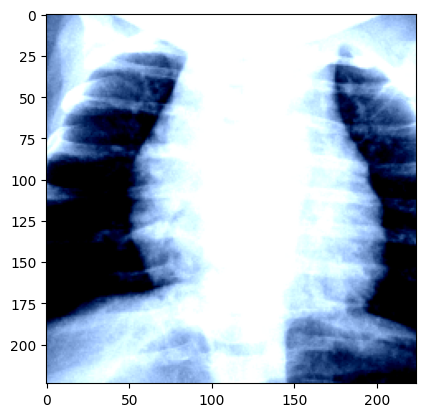

In [ ]:
test_iter = iter(dataloaders['test'])
f_images, f_labels = next(test_iter)
idx = round(random.randint(0, len(f_images) - 1))
f_image = f_images[idx]
plt.imshow(np.transpose(f_image.numpy(), (1, 2, 0)))

In [ ]:
#Iterate over each Conv2d layer to see resulting feature map
outputs = []
names = []
r_image = f_image.to(device)
for layer in conv_layers[0:]:
    r_image = layer(r_image)
    outputs.append(r_image)
    names.append(str(layer))


In [ ]:
#Convert 3D tensor to 2D
processed = []
for feature_map in outputs:
    feature_map = feature_map.squeeze(0)
    gray_scale = torch.sum(feature_map,0)
    gray_scale = gray_scale / feature_map.shape[0]
    processed.append(gray_scale.data.cpu().numpy())

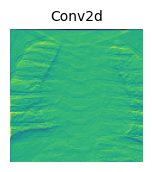

In [ ]:
fig = plt.figure(figsize=(25, 10))
for i in range(len(processed)):
    a = fig.add_subplot(5, 10, i+1)
    imgplot = plt.imshow(processed[i])
    a.axis("off")
    a.set_title(names[i].split('(')[0], fontsize=10)
plt.savefig(str('feature_maps.jpg'), bbox_inches='tight')

### Interpretability using ScoreCAM

In [ ]:
import copy
from pytorch_grad_cam import GradCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from torchvision.models import resnet18
import numpy as np
from PIL import Image
import torch
import torch.nn as nn
import torchvision

In [ ]:
image = (images[4])
print(f"Image shape before: {image.shape}")
image = image.unsqueeze(0)
print(f"Image shape after: {image.shape}")
image = image.to(device)

Image shape before: torch.Size([3, 224, 224])
Image shape after: torch.Size([1, 3, 224, 224])


In [ ]:
rgb_img = transforms.ToPILImage()(image.squeeze(0).cpu())
rgb_img = (rgb_img - np.min(rgb_img)) / (np.max(rgb_img) - np.min(rgb_img))

# Create an input tensor image for your model
#input_tensor = torchvision.transforms.functional.to_tensor(rgb_img).unsqueeze(0).float().to(device)
input_tensor = image
print(type(input_tensor))


# Construct the CAM object once, and then re-use it on many images:
cam = ScoreCAM(model=model.model, target_layers=[model.model.layer4[-1]], use_cuda=True)

grayscale_cam = cam(input_tensor=input_tensor)
grayscale_cam = grayscale_cam[0, :]
visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=False)


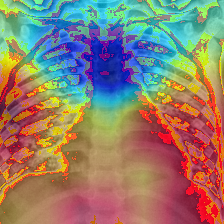

In [ ]:
PIL.Image.fromarray(visualization)

## Model Definition (VGG16)

In [ ]:
class PNEUNOMIA_CNN(torch.nn.Module):
    def __init__(self, num_classes=num_classes):
        super(PNEUNOMIA_CNN, self).__init__()
        self.model = torchvision.models.vgg16(models.VGG16_Weights.IMAGENET1K_V1).to(device)
        self.freeze()

        self.classifier = nn.Sequential(
            nn.Linear(self.model.classifier[6].in_features, num_classes),
        )

        self.model.classifier[6] = self.classifier

    def freeze(self):
        for parameter in self.model.parameters():
            parameter.requires_grad = False

    def forward(self, x):
        logits = self.model(x)
        probas = torch.softmax(logits, dim=1)
        return logits, probas


In [ ]:
# initialise model
model = PNEUNOMIA_CNN().to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:135: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:07<00:00, 70.5MB/s]


In [ ]:
from torchsummary import summary
summary(model.model, input_size=(3, 224, 224))

### Loss function




In [ ]:
#class_weights = class_weight.compute_class_weight('balanced', np.unique(y), y.numpy())
class_weights = torch.tensor([10.0, 1.0],dtype=torch.float)

In [ ]:
f_loss = torch.nn.CrossEntropyLoss(weight=class_weights)

### Optimizer


In [ ]:
optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)


# optimizers = {model_name: optim.SGD(cnn_models[model_name].model.parameters(), lr=learning_rate) for model_name in cnn_models}

### Scheduler


In [ ]:
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=30, gamma=0.1)

### Model Training
- Learning Process:
    1. Put inputs/labels into GPU device.
    2. Do forward propagation => Predictions
    3. Compute Loss function
    4. Do backward propagation => Gradients w.r.t. parameters
    5. Update parameters using gradients
        - `parameters = parameters - learning_rate * parameters_gradients`
    6. REPEAT learning process

In [ ]:
def compute_accuracy_and_loss(model, data_loader, device):

    correct_pred, num_examples = 0, 0

    cross_entropy = 0.

    predictions_arr = []
    targets_arr  = []

    for ii, (features, targets) in enumerate(data_loader):

        features = features.to(device) # x to device
        targets = targets.to(device) # y to device

        logits, probas = model(features) # forward propagation z=logits, a=f(z)
        cross_entropy += F.cross_entropy(logits, targets).item()
        #cross_entropy += F.nll_loss(torch.log(probas), targets)

        _, predicted_labels = torch.max(probas, 1) # y_hat=predicted_labels
        num_examples += targets.size(0)

        correct_pred += (predicted_labels == targets).sum()
        targets_arr.append(targets)
        predictions_arr.append(predicted_labels)

    return correct_pred.float()/num_examples * 100, cross_entropy/num_examples, targets_arr, predictions_arr

In [ ]:
def train(model, num_epochs, dataloaders, dataset_sizes, criterion, optimizer, scheduler, device):
    minibatch_cost = []
    train_acc_lst, valid_acc_lst = [], []
    train_loss_lst, valid_loss_lst = [], []

    best_acc = 0
    best_loss = np.inf

    start_time = time.time()

    # Create StratifiedShuffleSplit object
    sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)

    for epoch in range(num_epochs):
        model.train()

        for batch_idx, (features, targets) in enumerate(dataloaders['train']):
            features = features.to(device)
            targets = targets.to(device)

            # Forward-propagation
            logits, probas = model.forward(features)

            # Compute cost function
            cost = criterion(logits, targets)

            # Clean gradients
            optimizer.zero_grad()

            # Compute derivatives
            cost.backward()

            # Append minibatch cost
            minibatch_cost.append(cost.item())

            # Update model parameters
            optimizer.step()

            # Logging results
            if not batch_idx % 50:
                print('Epoch: %05d/%05d | Batch %05d/%05d | Cost: %.4f'
                      % (epoch + 1, num_epochs, batch_idx, len(dataloaders['train']), cost))

        scheduler.step()

        with torch.set_grad_enabled(False):
            train_acc, train_loss, _, _ = compute_accuracy_and_loss(model, dataloaders['train'], device=device)
            valid_acc, valid_loss, _, _ = compute_accuracy_and_loss(model, dataloaders['val'], device=device)

            print('Epoch: %05d/%05d | Train cost: %.4f | Valid cost: %.4f | Train acc.: %.4f%% | Val.acc.: %.4f%%' % (
                  epoch + 1, num_epochs, train_loss, valid_loss, train_acc, valid_acc))

            train_acc_lst.append(train_acc)
            valid_acc_lst.append(valid_acc)
            train_loss_lst.append(train_loss)
            valid_loss_lst.append(valid_loss)

        print('Time elapsed: %.2f min' % ((time.time() - start_time) / 60))

    print('Total Training Time: %.2f min' % ((time.time() - start_time) / 60))

    return minibatch_cost, train_loss_lst, valid_loss_lst, train_acc_lst, valid_acc_lst


In [ ]:
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Call the train function with all the required arguments
minibatch_cost, train_loss_lst, valid_loss_lst, train_acc_lst, valid_acc_lst = train(model, num_epochs, dataloaders, dataset_sizes, criterion, optimizer, scheduler, device)


Epoch: 00001/00015 | Batch 00000/00326 | Cost: 0.2544
Epoch: 00001/00015 | Batch 00050/00326 | Cost: 0.1792
Epoch: 00001/00015 | Batch 00100/00326 | Cost: 0.1069
Epoch: 00001/00015 | Batch 00150/00326 | Cost: 0.1693
Epoch: 00001/00015 | Batch 00200/00326 | Cost: 0.5436
Epoch: 00001/00015 | Batch 00250/00326 | Cost: 0.6201
Epoch: 00001/00015 | Batch 00300/00326 | Cost: 0.1652
Epoch: 00001/00015 | Train cost: 0.0181 | Valid cost: 0.0507 | Train acc.: 89.1871% | Val.acc.: 62.5000%
Time elapsed: 2.96 min
Epoch: 00002/00015 | Batch 00000/00326 | Cost: 0.7136
Epoch: 00002/00015 | Batch 00050/00326 | Cost: 0.3535
Epoch: 00002/00015 | Batch 00100/00326 | Cost: 0.2098
Epoch: 00002/00015 | Batch 00150/00326 | Cost: 0.4127
Epoch: 00002/00015 | Batch 00200/00326 | Cost: 0.1207
Epoch: 00002/00015 | Batch 00250/00326 | Cost: 0.1785
Epoch: 00002/00015 | Batch 00300/00326 | Cost: 0.0279
Epoch: 00002/00015 | Train cost: 0.0150 | Valid cost: 0.0322 | Train acc.: 90.5100% | Val.acc.: 75.0000%
Time elapse

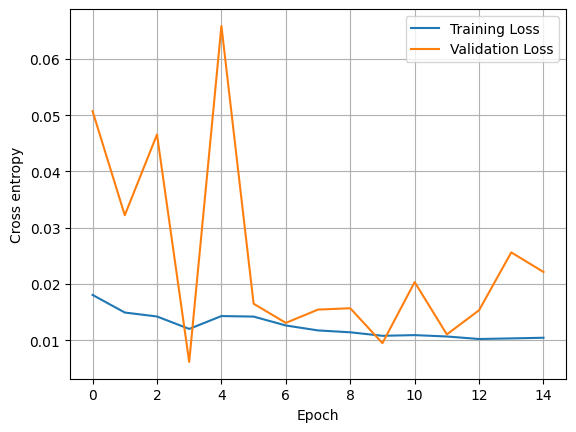

In [ ]:
plt.plot(range(len(train_loss_lst)), (train_loss_lst), label='Training Loss')
plt.plot(range(len(valid_loss_lst)), (valid_loss_lst), label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross entropy')
plt.xlabel('Epoch')
plt.grid()
plt.show()

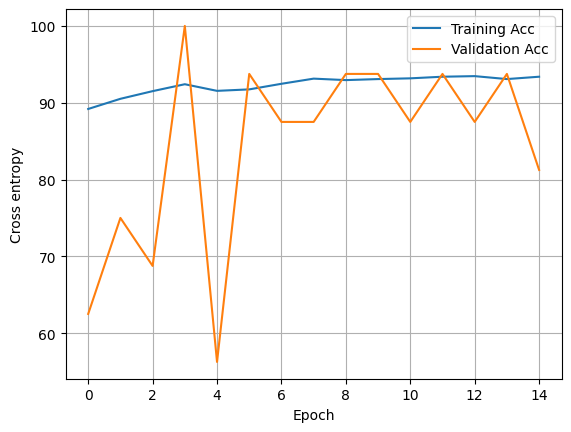

In [ ]:
plt.plot(range(len(train_acc_lst)), [tensor.cpu() for tensor in train_acc_lst], label='Training Acc')
plt.plot(range(len(valid_acc_lst)), [tensor.cpu() for tensor in valid_acc_lst], label='Validation Acc')
# plt.plot(range(len(train_acc_lst)), train_acc_lst, label='Training Acc')
# plt.plot(range(len(valid_acc_lst)), valid_acc_lst, label='Validation Acc')
plt.legend(loc='upper right')
plt.ylabel('Cross entropy')
plt.xlabel('Epoch')
plt.grid()
plt.show()

### Model Evaluation


In [ ]:
test_acc, test_loss, test_targets, test_preds = compute_accuracy_and_loss(model, dataloaders['test'], device) # compute accuracy on test dataset
print('Test accuracy: %.2f%%' % (test_acc))

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Test accuracy: 76.44%


In [ ]:
test_targets = torch.tensor(test_targets).cpu()
test_preds = torch.tensor(test_preds).cpu()

test_targets = torch.hstack((test_targets,))
test_preds = torch.hstack((test_preds,))

In [ ]:
print(test_targets.shape)
print(test_preds.shape)

torch.Size([624])
torch.Size([624])


<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

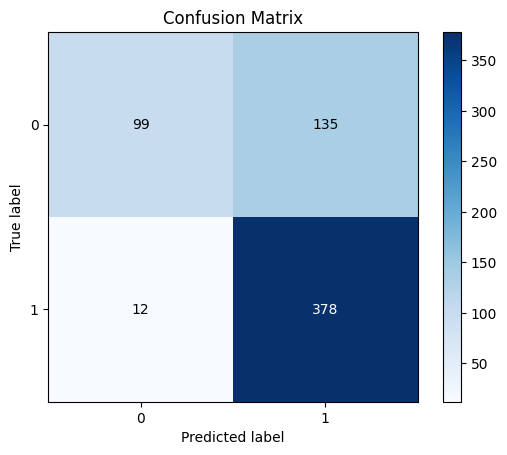

In [ ]:
skplt.metrics.plot_confusion_matrix(test_targets,test_preds, normalize=False)

In [ ]:
for ii in range(len(class_names)):
    correct = ((test_targets == ii)*1) * ((np.array(test_preds) == test_targets)*1)
    print('{}, {}: '.rjust(10).format(ii, class_names[ii]) + '{:.2f}%'.
          format(100*correct.sum()/test_targets[test_targets == ii].shape[0]))

  0, NORMAL: 0.00%
  1, PNEUMONIA: 0.00%


In [ ]:
# obtain one batch of test images
data_iter = iter(dataloaders['test'])
images, targets = next(data_iter)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
# get sample outputs
logits, probas = model(images.to(device))

# convert output probabilities to predicted class
_, preds = torch.max(probas, 1)

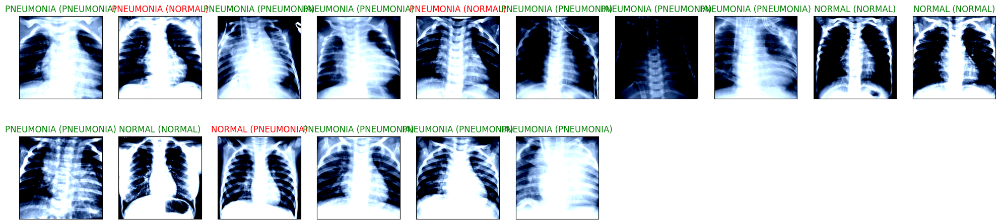

In [ ]:
# Visualise some predicted images
fig = plt.figure(figsize=(25, 15))
for idx in np.arange(len(images)):
    ax = fig.add_subplot(5, 10, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(images[idx].numpy(), (1, 2, 0)))
    ax.set_title("{} ({})".format(class_names[preds[idx]], class_names[targets[idx]]),
                 color=("green" if preds[idx]==targets[idx].item() else "red"))


### Interpretability Using Feature Maps
[Reference](https://ravivaishnav20.medium.com/visualizing-feature-maps-using-pytorch-12a48cd1e573)

In [ ]:
# Gets all the Conv2d layers to visualize how the learn weights look like
model_weights =[]
conv_layers = []
model_children = list(model.model.children())
counter = 0
for i in range(len(model_children)):
    if type(model_children[i]) == nn.Conv2d:
        counter+=1
        model_weights.append(model_children[i].weight)
        conv_layers.append(model_children[i])
    elif type(model_children[i]) == nn.Sequential:
        for j in range(len(model_children[i])):
            for child in model_children[i][j].children():
                if type(child) == nn.Conv2d:
                    counter+=1
                    model_weights.append(child.weight)
                    conv_layers.append(child)

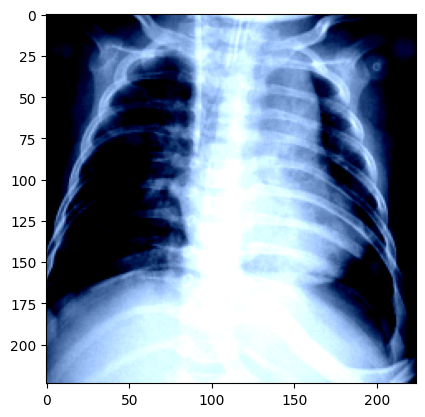

In [ ]:
test_iter = iter(dataloaders['test'])
f_images, f_labels = next(test_iter)
idx = round(random.randint(0, len(f_images) - 1))
f_image = f_images[idx]
plt.imshow(np.transpose(f_image.numpy(), (1, 2, 0)))

In [ ]:
#Iterate over each Conv2d layer to see resulting feature map
outputs = []
names = []
r_image = f_image.to(device)
for layer in conv_layers[0:]:
    r_image = layer(r_image)
    outputs.append(r_image)
    names.append(str(layer))


In [ ]:
#Convert 3D tensor to 2D
processed = []
for feature_map in outputs:
    feature_map = feature_map.squeeze(0)
    gray_scale = torch.sum(feature_map,0)
    gray_scale = gray_scale / feature_map.shape[0]
    processed.append(gray_scale.data.cpu().numpy())

In [ ]:
fig = plt.figure(figsize=(25, 10))
for i in range(len(processed)):
    a = fig.add_subplot(5, 10, i+1)
    imgplot = plt.imshow(processed[i])
    a.axis("off")
    a.set_title(names[i].split('(')[0], fontsize=10)
plt.savefig(str('feature_maps.jpg'), bbox_inches='tight')

<Figure size 2500x1000 with 0 Axes>

### Interpretability using ScoreCAM

In [ ]:
import copy
from pytorch_grad_cam import GradCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from torchvision.models import resnet18
import numpy as np
from PIL import Image
import torch
import torch.nn as nn
import torchvision

In [ ]:
image = (images[4])
print(f"Image shape before: {image.shape}")
image = image.unsqueeze(0)
print(f"Image shape after: {image.shape}")
image = image.to(device)

Image shape before: torch.Size([3, 224, 224])
Image shape after: torch.Size([1, 3, 224, 224])


In [ ]:
rgb_img = transforms.ToPILImage()(image.squeeze(0).cpu())
rgb_img = (rgb_img - np.min(rgb_img)) / (np.max(rgb_img) - np.min(rgb_img))

# Create an input tensor image for your model
#input_tensor = torchvision.transforms.functional.to_tensor(rgb_img).unsqueeze(0).float().to(device)
input_tensor = image
print(type(input_tensor))


# Construct the CAM object once, and then re-use it on many images:
cam = ScoreCAM(model=model.model, target_layers=[model.model.layer4[-1]], use_cuda=True)

grayscale_cam = cam(input_tensor=input_tensor)
grayscale_cam = grayscale_cam[0, :]
visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=False)


<class 'torch.Tensor'>


AttributeError: ignored

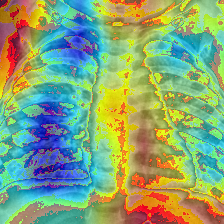

In [ ]:
PIL.Image.fromarray(visualization)

## Model Definition (InceptionV3)

In [ ]:
mean_values = [0.485, 0.456, 0.406]
std_values = [0.229, 0.224, 0.225]

# data augmentation
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize(299),
        transforms.CenterCrop(299),
        transforms.ToTensor(),
        transforms.Normalize(mean_values, std_values)
    ]),
    'val': transforms.Compose([
        transforms.Resize(299),
        transforms.CenterCrop(299),
        transforms.ToTensor(),
        transforms.Normalize(mean_values, std_values)
    ]),
    'test': transforms.Compose([
        transforms.Resize(299),
        transforms.CenterCrop(299),
        transforms.ToTensor(),
        transforms.Normalize(mean_values, std_values)
    ]),
}

In [ ]:
# loads the images from test and train folders who are in dataset folder
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms[x]) for x in categories}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=batch_size, shuffle=True, num_workers=num_workers) for x in categories}
dataset_sizes = {x: len(image_datasets[x]) for x in categories}
class_names = image_datasets['train'].classes
num_classes = len(class_names)

In [ ]:
from sklearn.model_selection import StratifiedShuffleSplit

num_splits = 1
test_size = 0.2

# Create a Stratified Shuffle Split cross-validator
stratified_shuffle_split = StratifiedShuffleSplit(n_splits=num_splits, test_size=test_size, random_state=42)

train_indices = {}
test_indices = {}

for train_idx, test_idx in stratified_shuffle_split.split(image_datasets['train'].samples, image_datasets['train'].targets):
    train_indices['split'] = train_idx
    test_indices['split'] = test_idx

train_dataset = torch.utils.data.Subset(image_datasets['train'], train_indices['split'])
test_dataset = torch.utils.data.Subset(image_datasets['train'], test_indices['split'])

train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)



/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
class PNEUNOMIA_CNN(torch.nn.Module):
    def __init__(self, num_classes=num_classes):
        super(PNEUNOMIA_CNN, self).__init__()
        self.model = models.inception_v3(pretrained=True, aux_logits=True)
        self.freeze()
        self.classifier = nn.Linear(self.model.fc.in_features, num_classes)

    def freeze(self):
        for parameter in self.model.parameters():
            parameter.requires_grad = False

    def forward(self, x):
        # Get the raw logits from the model
        logits, aux_logits = self.model(x)  # Assuming aux_logits is not needed

        # Apply softmax to the logits
        probas = torch.softmax(logits, dim=1)
        return logits, probas

In [ ]:
# initialise model
model = PNEUNOMIA_CNN().to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
from torchsummary import summary
summary(model.model, input_size=(3, 299, 299))


### Loss function




In [ ]:
#class_weights = class_weight.compute_class_weight('balanced', np.unique(y), y.numpy())
class_weights = torch.tensor([10.0, 1.0],dtype=torch.float)

In [ ]:
f_loss = torch.nn.CrossEntropyLoss(weight=class_weights)

### Optimizer


In [ ]:
optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)
# optimizers = {model_name: optim.SGD(cnn_models[model_name].model.parameters(), lr=learning_rate) for model_name in cnn_models}

### Scheduler


In [ ]:
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=30, gamma=0.1)

### Model Training
- Learning Process:
    1. Put inputs/labels into GPU device.
    2. Do forward propagation => Predictions
    3. Compute Loss function
    4. Do backward propagation => Gradients w.r.t. parameters
    5. Update parameters using gradients
        - `parameters = parameters - learning_rate * parameters_gradients`
    6. REPEAT learning process

In [ ]:
def compute_accuracy_and_loss(model, data_loader, device):

    correct_pred, num_examples = 0, 0

    cross_entropy = 0.

    predictions_arr = []
    targets_arr  = []

    for ii, (features, targets) in enumerate(data_loader):

        features = features.to(device) # x to device
        targets = targets.to(device) # y to device

        logits, probas = model(features) # forward propagation z=logits, a=f(z)
        cross_entropy += F.cross_entropy(logits, targets).item()
        #cross_entropy += F.nll_loss(torch.log(probas), targets)

        _, predicted_labels = torch.max(probas, 1) # y_hat=predicted_labels
        num_examples += targets.size(0)

        correct_pred += (predicted_labels == targets).sum()
        targets_arr.append(targets)
        predictions_arr.append(predicted_labels)

    return correct_pred.float()/num_examples * 100, cross_entropy/num_examples, targets_arr, predictions_arr

In [ ]:
def train(model, num_epochs, dataloaders, dataset_sizes, criterion, optimizer, scheduler, device):
    minibatch_cost = []
    train_acc_lst, valid_acc_lst = [], []
    train_loss_lst, valid_loss_lst = [], []

    best_acc = 0
    best_loss = np.inf

    start_time = time.time()

    # Create StratifiedShuffleSplit object
    sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)

    for parameter in model.parameters():
        parameter.requires_grad = True

    for epoch in range(num_epochs):
        model.train()

        for batch_idx, (features, targets) in enumerate(dataloaders['train']):
            features = features.to(device)
            targets = targets.to(device)

            # Forward-propagation
            logits, probas = model.forward(features)

            # Compute cost function
            cost = criterion(logits, targets)

            # Clean gradients
            optimizer.zero_grad()

            # Compute derivatives
            cost.backward()

            # Append minibatch cost
            minibatch_cost.append(cost.item())

            # Update model parameters
            optimizer.step()

            # Logging results
            if not batch_idx % 50:
                print('Epoch: %05d/%05d | Batch %05d/%05d | Cost: %.4f'
                      % (epoch + 1, num_epochs, batch_idx, len(dataloaders['train']), cost))

        scheduler.step()

        with torch.set_grad_enabled(False):
            train_acc, train_loss, _, _ = compute_accuracy_and_loss(model, dataloaders['train'], device=device)
            valid_acc, valid_loss, _, _ = compute_accuracy_and_loss(model, dataloaders['val'], device=device)

            print('Epoch: %05d/%05d | Train cost: %.4f | Valid cost: %.4f | Train acc.: %.4f%% | Val.acc.: %.4f%%' % (
                  epoch + 1, num_epochs, train_loss, valid_loss, train_acc, valid_acc))

            train_acc_lst.append(train_acc)
            valid_acc_lst.append(valid_acc)
            train_loss_lst.append(train_loss)
            valid_loss_lst.append(valid_loss)

        print('Time elapsed: %.2f min' % ((time.time() - start_time) / 60))

    print('Total Training Time: %.2f min' % ((time.time() - start_time) / 60))

    return minibatch_cost, train_loss_lst, valid_loss_lst, train_acc_lst, valid_acc_lst


In [ ]:
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Call the train function with all the required arguments
minibatch_cost, train_loss_lst, valid_loss_lst, train_acc_lst, valid_acc_lst = train(model, num_epochs, dataloaders, dataset_sizes, criterion, optimizer, scheduler, device)


Epoch: 00001/00015 | Batch 00000/00326 | Cost: 7.4292
Epoch: 00001/00015 | Batch 00050/00326 | Cost: 0.2672
Epoch: 00001/00015 | Batch 00100/00326 | Cost: 0.2907
Epoch: 00001/00015 | Batch 00150/00326 | Cost: 0.3745
Epoch: 00001/00015 | Batch 00200/00326 | Cost: 0.0209
Epoch: 00001/00015 | Batch 00250/00326 | Cost: 0.0646
Epoch: 00001/00015 | Batch 00300/00326 | Cost: 0.0079
Epoch: 00001/00015 | Train cost: 0.0041 | Valid cost: 0.0306 | Train acc.: 97.6994% | Val.acc.: 87.5000%
Time elapsed: 3.73 min
Epoch: 00002/00015 | Batch 00000/00326 | Cost: 0.1471
Epoch: 00002/00015 | Batch 00050/00326 | Cost: 0.0908
Epoch: 00002/00015 | Batch 00100/00326 | Cost: 0.0075
Epoch: 00002/00015 | Batch 00150/00326 | Cost: 0.0036
Epoch: 00002/00015 | Batch 00200/00326 | Cost: 0.0048
Epoch: 00002/00015 | Batch 00250/00326 | Cost: 0.0194
Epoch: 00002/00015 | Batch 00300/00326 | Cost: 0.3883
Epoch: 00002/00015 | Train cost: 0.0024 | Valid cost: 0.0322 | Train acc.: 98.8113% | Val.acc.: 75.0000%
Time elapse

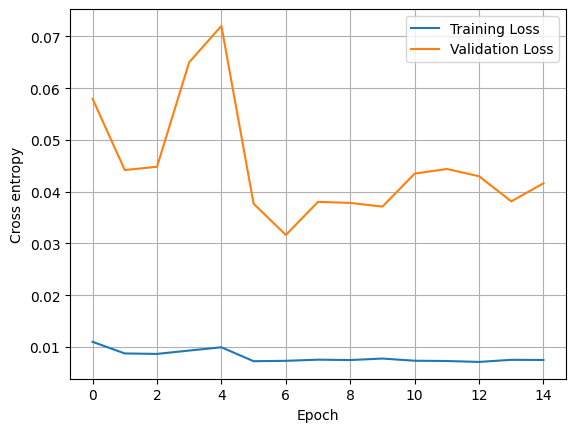

In [ ]:
plt.plot(range(len(train_loss_lst)), (train_loss_lst), label='Training Loss')
plt.plot(range(len(valid_loss_lst)), (valid_loss_lst), label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross entropy')
plt.xlabel('Epoch')
plt.grid()
plt.show()

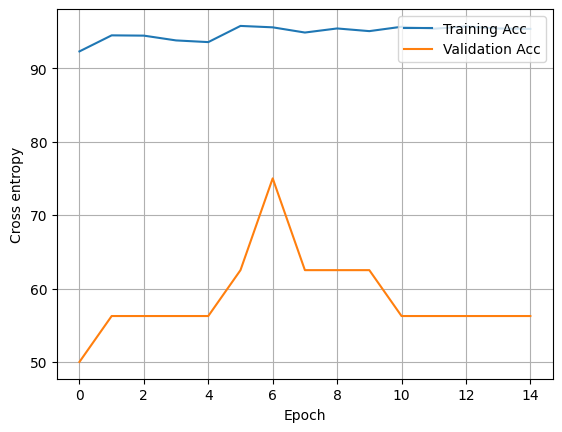

In [ ]:
plt.plot(range(len(train_acc_lst)), [tensor.cpu() for tensor in train_acc_lst], label='Training Acc')
plt.plot(range(len(valid_acc_lst)), [tensor.cpu() for tensor in valid_acc_lst], label='Validation Acc')
# plt.plot(range(len(train_acc_lst)), train_acc_lst, label='Training Acc')
# plt.plot(range(len(valid_acc_lst)), valid_acc_lst, label='Validation Acc')
plt.legend(loc='upper right')
plt.ylabel('Cross entropy')
plt.xlabel('Epoch')
plt.grid()
plt.show()

### Model Evaluation


In [ ]:
test_acc, test_loss, test_targets, test_preds = compute_accuracy_and_loss(model, dataloaders['test'], device) # compute accuracy on test dataset
print('Test accuracy: %.2f%%' % (test_acc))

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Test accuracy: 81.09%


In [ ]:
test_targets = torch.hstack(test_targets).cpu().detach().numpy()
test_preds = torch.hstack(test_preds).cpu().detach().numpy()

In [ ]:
print(test_targets.shape)
print(test_preds.shape)

(624,)
(624,)


<Axes: title={'center': 'Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

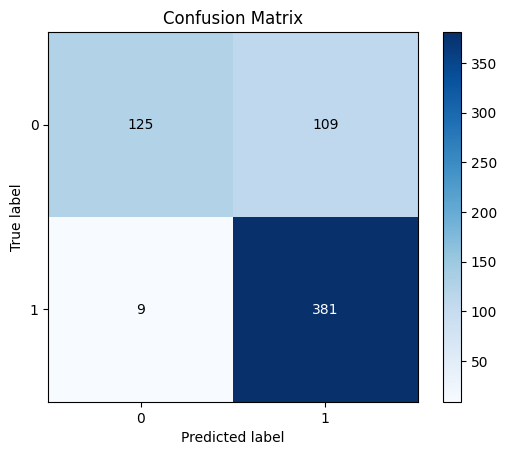

In [ ]:
skplt.metrics.plot_confusion_matrix(test_targets,test_preds, normalize=False)

In [ ]:
for ii in range(len(class_names)):
    correct = ((test_targets == ii)*1) * ((np.array(test_preds) == test_targets)*1)
    print('{}, {}: '.rjust(10).format(ii, class_names[ii]) + '{:.2f}%'.
          format(100*correct.sum()/test_targets[test_targets == ii].shape[0]))

  0, NORMAL: 53.42%
  1, PNEUMONIA: 97.69%


In [ ]:
# obtain one batch of test images
data_iter = iter(dataloaders['test'])
images, targets = next(data_iter)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
# get sample outputs
logits, probas = model(images.to(device))

# convert output probabilities to predicted class
_, preds = torch.max(probas, 1)

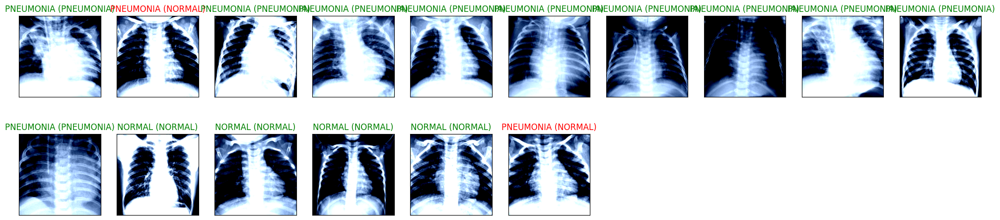

In [ ]:
# Visualise some predicted images
fig = plt.figure(figsize=(25, 15))
for idx in np.arange(len(images)):
    ax = fig.add_subplot(5, 10, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(images[idx].numpy(), (1, 2, 0)))
    ax.set_title("{} ({})".format(class_names[preds[idx]], class_names[targets[idx]]),
                 color=("green" if preds[idx]==targets[idx].item() else "red"))


### Interpretability Using Feature Maps
[Reference](https://ravivaishnav20.medium.com/visualizing-feature-maps-using-pytorch-12a48cd1e573)

In [ ]:
# Gets all the Conv2d layers to visualize how the learn weights look like
model_weights =[]
conv_layers = []
model_children = list(model.model.children())
counter = 0
for i in range(len(model_children)):
    if type(model_children[i]) == nn.Conv2d:
        counter+=1
        model_weights.append(model_children[i].weight)
        conv_layers.append(model_children[i])
    elif type(model_children[i]) == nn.Sequential:
        for j in range(len(model_children[i])):
            for child in model_children[i][j].children():
                if type(child) == nn.Conv2d:
                    counter+=1
                    model_weights.append(child.weight)
                    conv_layers.append(child)

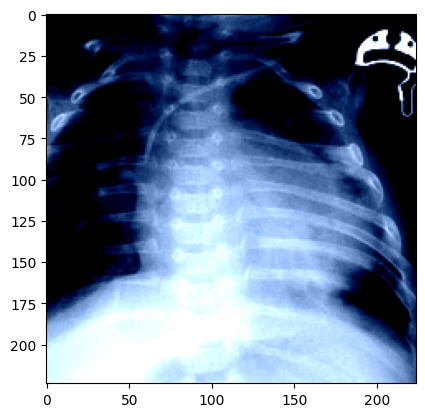

In [ ]:
test_iter = iter(dataloaders['test'])
f_images, f_labels = next(test_iter)
idx = round(random.randint(0, len(f_images) - 1))
f_image = f_images[idx]
plt.imshow(np.transpose(f_image.numpy(), (1, 2, 0)))

In [ ]:
#Iterate over each Conv2d layer to see resulting feature map
outputs = []
names = []
r_image = f_image.to(device)
for layer in conv_layers[0:]:
    r_image = layer(r_image)
    outputs.append(r_image)
    names.append(str(layer))


In [ ]:
#Convert 3D tensor to 2D
processed = []
for feature_map in outputs:
    feature_map = feature_map.squeeze(0)
    gray_scale = torch.sum(feature_map,0)
    gray_scale = gray_scale / feature_map.shape[0]
    processed.append(gray_scale.data.cpu().numpy())

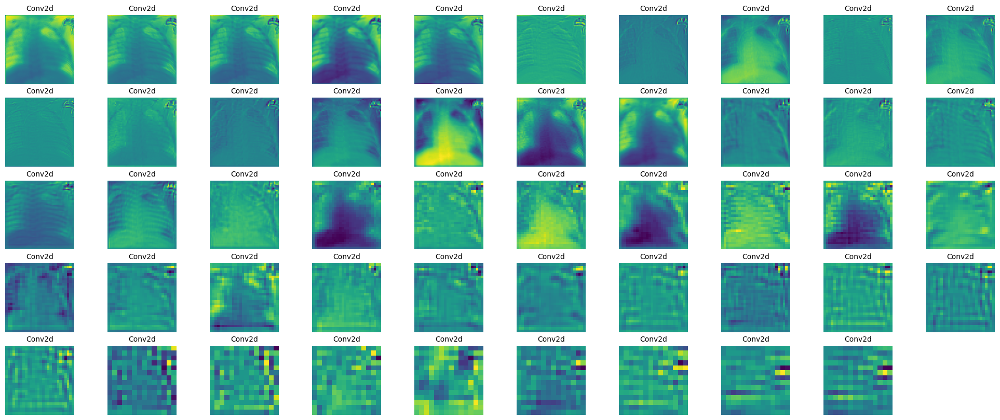

In [ ]:
fig = plt.figure(figsize=(25, 10))
for i in range(len(processed)):
    a = fig.add_subplot(5, 10, i+1)
    imgplot = plt.imshow(processed[i])
    a.axis("off")
    a.set_title(names[i].split('(')[0], fontsize=10)
plt.savefig(str('feature_maps.jpg'), bbox_inches='tight')

### Interpretability using ScoreCAM

In [ ]:
import copy
from pytorch_grad_cam import GradCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from torchvision.models import resnet18
import numpy as np
from PIL import Image
import torch
import torch.nn as nn
import torchvision

In [ ]:
image = (images[4])
print(f"Image shape before: {image.shape}")
image = image.unsqueeze(0)
print(f"Image shape after: {image.shape}")
image = image.to(device)

Image shape before: torch.Size([3, 224, 224])
Image shape after: torch.Size([1, 3, 224, 224])


In [ ]:
rgb_img = transforms.ToPILImage()(image.squeeze(0).cpu())
rgb_img = (rgb_img - np.min(rgb_img)) / (np.max(rgb_img) - np.min(rgb_img))

# Create an input tensor image for your model
#input_tensor = torchvision.transforms.functional.to_tensor(rgb_img).unsqueeze(0).float().to(device)
input_tensor = image
print(type(input_tensor))


# Construct the CAM object once, and then re-use it on many images:
cam = ScoreCAM(model=model.model, target_layers=[model.model.layer4[-1]], use_cuda=True)

grayscale_cam = cam(input_tensor=input_tensor)
grayscale_cam = grayscale_cam[0, :]
visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=False)


<class 'torch.Tensor'>


100%|██████████| 128/128 [00:05<00:00, 21.91it/s]


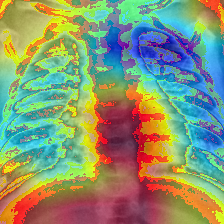

In [ ]:
PIL.Image.fromarray(visualization)